# ENVIRONMENT

In [750]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.formula.api import ols
from statsmodels.api import qqplot
from statsmodels.tools import add_constant
import statsmodels.api as sm

from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import RidgeCV
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LassoCV
from sklearn import preprocessing
from scipy import stats
from sklearn.feature_extraction.text import CountVectorizer
import re

import nltk
nltk.download("stopwords")
from nltk.tokenize import RegexpTokenizer

from nltk.corpus import stopwords
STOP_WORDS = stopwords.words("english")

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

nltk.download('punkt')


# suppress scientific notation in Pandas
pd.options.display.float_format = "{:.2f}".format
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 1000)
pd.set_option("display.max_colwidth", 5000)

plt.rcParams["figure.figsize"] = [12, 10]
plt.rcParams["figure.dpi"] = 150

sns.set()
sns.set_context("notebook", rc={"lines.linewidth": 2.5})
sns.set_style("whitegrid")

import warnings

warnings.filterwarnings("ignore")

RANDOM_STATE = 1


[nltk_data] Downloading package stopwords to /Users/chris/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

[nltk_data] Downloading package punkt to /Users/chris/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [783]:
# remove list formatting from "amenities" feature
original_df = pd.read_csv("./src/NYC_Airbnb/listings.csv", encoding='utf8', converters={"amenities": lambda x: x.strip("[]").replace("\"","").split(", ")})

prep_df = original_df.copy()


In [784]:
original_df.shape


(39881, 75)

In [292]:
original_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39881 entries, 0 to 39880
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            39881 non-null  int64  
 1   listing_url                                   39881 non-null  object 
 2   scrape_id                                     39881 non-null  int64  
 3   last_scraped                                  39881 non-null  object 
 4   source                                        39881 non-null  object 
 5   name                                          39868 non-null  object 
 6   description                                   39036 non-null  object 
 7   neighborhood_overview                         23466 non-null  object 
 8   picture_url                                   39881 non-null  object 
 9   host_id                                       39881 non-null 

In [219]:
original_df.describe()


,id,scrape_id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
count,39881.00,39881.00,39881.00,39831.00,39831.00,39881.00,39881.00,39881.00,0.00,36098.00,38997.00,39881.00,39881.00,39867.00,39867.00,39867.00,39867.00,39867.00,39867.00,0.00,39881.00,39881.00,39881.00,39881.00,39881.00,39881.00,39881.00,31519.00,31056.00,31066.00,31052.00,31061.00,31049.00,31049.00,39881.00,39881.00,39881.00,39881.00,31519.00
mean,116230261671512624.00,20220907064706.31,131341969.28,68.15,91.36,40.73,-73.95,2.93,NaN,1.36,1.64,19.13,55443.45,19.95,27.42,1994810.86,2318018.53,26.91,2100600.96,NaN,5.58,14.88,27.02,131.54,26.69,7.75,0.75,4.63,4.75,4.63,4.82,4.81,4.74,4.65,16.93,10.31,6.49,0.06,1.24
std,246519682242047360.00,8.69,145567413.67,443.62,571.17,0.06,0.06,2.00,NaN,0.73,1.12,31.43,10754350.48,41.51,81.59,65392574.17,70490232.27,79.46,65956366.85,NaN,8.73,19.73,31.69,138.54,56.26,18.78,1.92,0.74,0.47,0.54,0.41,0.44,0.41,0.49,59.60,51.75,31.06,0.68,1.99
min,2539.00,20220907064715.00,2438.00,1.00,1.00,40.50,-74.27,0.00,NaN,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,NaN,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.01
25%,16331969.00,20220907064715.00,13639385.00,1.00,1.00,40.69,-73.98,2.00,NaN,1.00,1.00,2.00,50.00,2.00,2.00,360.00,365.00,2.00,365.00,NaN,0.00,0.00,0.00,0.00,1.00,0.00,0.00,4.59,4.71,4.50,4.80,4.80,4.66,4.56,1.00,0.00,0.00,0.00,0.14
50%,38236832.00,20220907064715.00,59746634.00,2.00,3.00,40.72,-73.95,2.00,NaN,1.00,1.00,14.00,365.00,14.00,16.00,1125.00,1125.00,15.00,1125.00,NaN,0.00,2.00,8.00,75.00,5.00,1.00,0.00,4.83,4.90,4.80,4.95,4.96,4.86,4.78,1.00,1.00,0.00,0.00,0.56
75%,52557797.00,20220907064715.00,223374565.00,4.00,7.00,40.76,-73.93,4.00,NaN,2.00,2.00,30.00,1125.00,30.00,30.00,1125.00,1125.00,30.00,1125.00,NaN,8.00,30.00,56.00,277.00,25.00,7.00,1.00,5.00,5.00,5.00,5.00,5.00,5.00,4.98,4.00,1.00,1.00,0.00,1.79
max,709854858248316416.00,20220907064715.00,478260569.00,4022.00,6958.00,40.93,-73.69,16.00,NaN,13.00,24.00,1250.00,2147483647.00,1250.00,1250.00,2147483647.00,2147483647.00,1250.00,2147483647.00,NaN,30.00,60.00,90.00,365.00,1480.00,949.00,122.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,453.00,453.00,288.00,19.00,123.00


In [296]:
original_df.head()


,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2539,https://www.airbnb.com/rooms/2539,20220907064715,2022-09-07,city scrape,Clean & quiet apt home by the park,Renovated apt home in elevator building.<br />...,Close to Prospect Park and Historic Ditmas Park,https://a0.muscache.com/pictures/3949d073-a02e...,2787,https://www.airbnb.com/users/show/2787,John,2008-09-07,"New York, NY",Educated professional living in Brooklyn. I l...,within an hour,100%,90%,f,https://a0.muscache.com/im/pictures/user/86745...,https://a0.muscache.com/im/pictures/user/86745...,Gravesend,9.00,12.00,"['email', 'phone']",t,t,"Brooklyn , New York, United States",Kensington,Brooklyn,40.65,-73.97,Private room in rental unit,Private room,2,NaN,1 shared bath,1.00,1.00,"[First aid kit, Microwave, Stove, Coffee maker...",$299.00,30,730,30.00,30.00,730.00,730.00,30.00,730.00,NaN,t,21,51,81,356,2022-09-07,9,0,0,2015-12-04,2018-10-19,4.89,4.88,5.00,5.00,5.00,4.75,4.88,NaN,f,9,1,6,2,0.11
1,2595,https://www.airbnb.com/rooms/2595,20220907064715,2022-09-07,city scrape,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,Jennifer,2008-09-09,"New York, NY",A New Yorker since (Phone number hidden by Air...,within a day,75%,23%,f,https://a0.muscache.com/im/pictures/user/50fc5...,https://a0.muscache.com/im/pictures/user/50fc5...,Midtown,6.00,9.00,"['email', 'phone', 'work_email']",t,t,"New York, United States",Midtown,Manhattan,40.75,-73.99,Entire rental unit,Entire home/apt,1,NaN,1 bath,NaN,1.00,"[Stove, Coffee maker, Long term stays allowed,...",$175.00,30,1125,30.00,30.00,1125.00,1125.00,30.00,1125.00,NaN,t,0,0,5,280,2022-09-07,49,1,0,2009-11-21,2022-06-21,4.68,4.73,4.63,4.77,4.80,4.81,4.40,NaN,f,3,3,0,0,0.31
2,5121,https://www.airbnb.com/rooms/5121,20220907064715,2022-09-07,city scrape,BlissArtsSpace!,One room available for rent in a 2 bedroom apt...,NaN,https://a0.muscache.com/pictures/2090980c-b68e...,7356,https://www.airbnb.com/users/show/7356,Garon,2009-02-03,"New York, NY","I am an artist(painter, filmmaker) and curato...",within an hour,100%,100%,t,https://a0.muscache.com/im/pictures/user/72a61...,https://a0.muscache.com/im/pictures/user/72a61...,Bedford-Stuyvesant,2.00,2.00,"['email', 'phone']",t,t,NaN,Bedford-Stuyvesant,Brooklyn,40.69,-73.96,Private room in rental unit,Private room,2,NaN,NaN,1.00,1.00,"[Heating, Kitchen, Air conditioning, Wifi, Lon...",$60.00,30,730,30.00,30.00,730.00,730.00,30.00,730.00,NaN,t,5,30,60,335,2022-09-07,50,0,0,2009-05-28,2019-12-02,4.52,4.22,4.09,4.91,4.91,4.47,4.52,NaN,f,2,0,2,0,0.31
3,45910,https://www.airbnb.com/r

# Part I: Research Question 
---

### [ ] 1. Research Question
### [ ] 2. Research Question Justification
### [ ] 3. Existing Research
### [ ] 4. Hypothesis


# Part II: Data Collection
---

### [ ] 1. Collected Data


### [ ] 2. Exploratory Data Analysis
#### [ ] a. distribution of features
#### [ ] a. distribution of prices


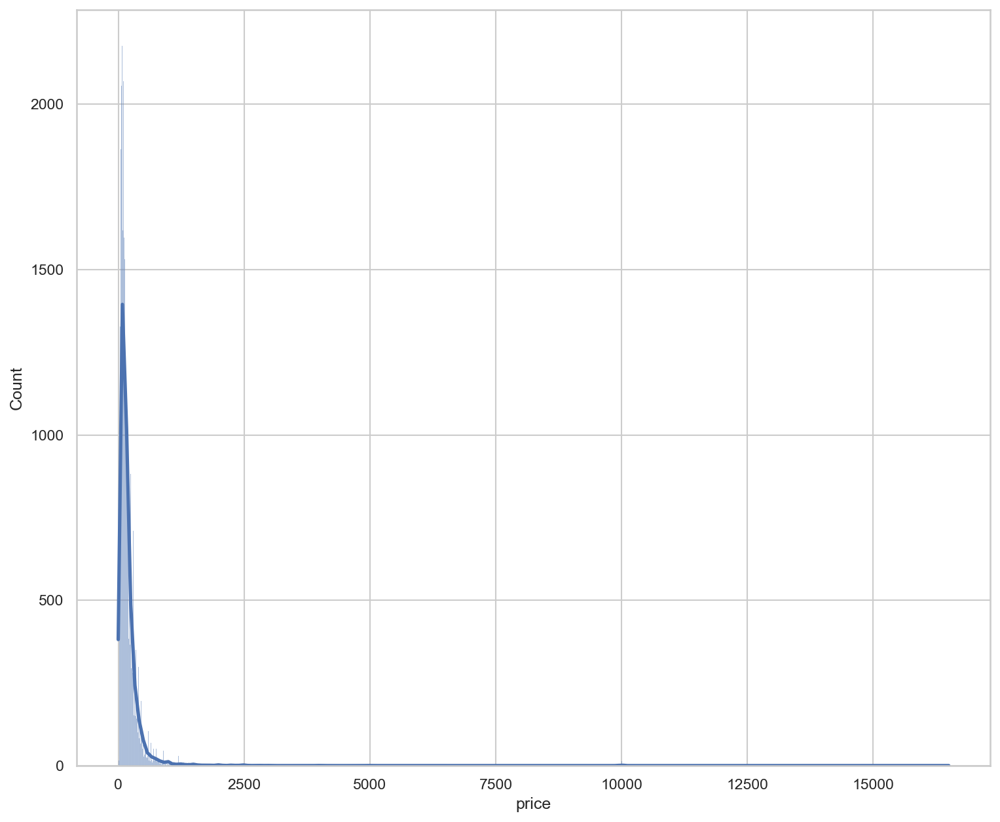

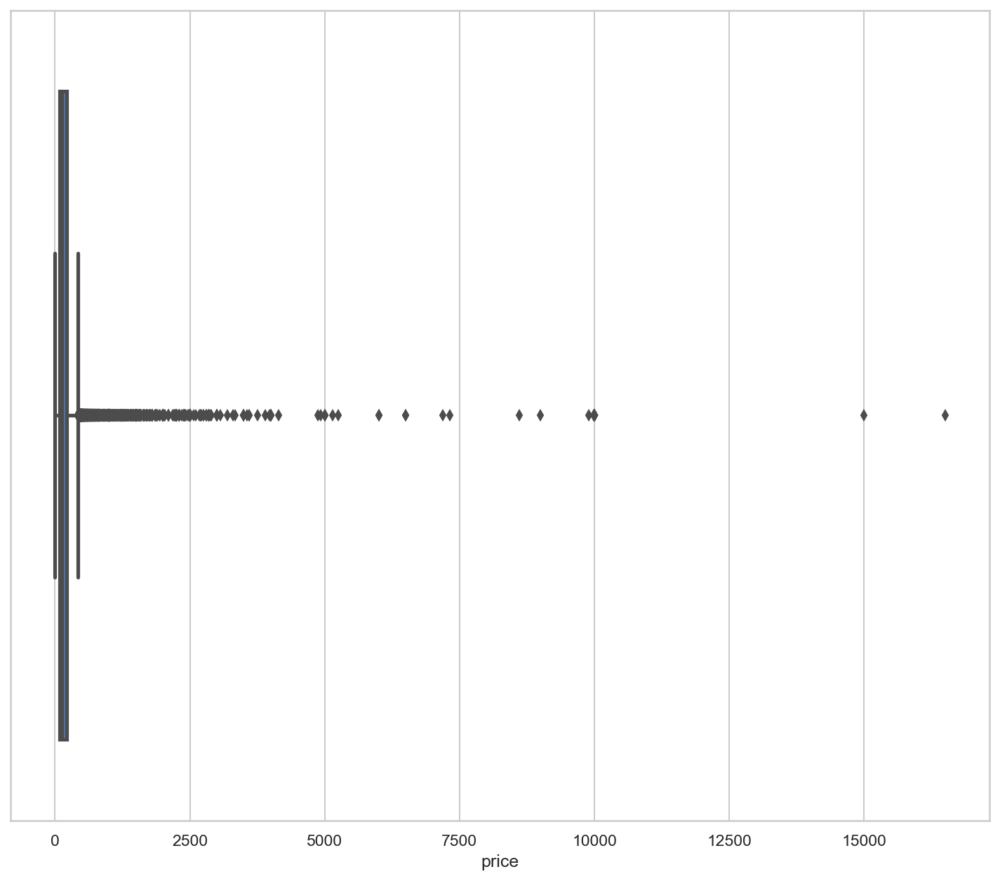

In [28]:
# sns.histplot(round(prep_df.price)
prep_df.price = original_df.price.str.replace("$", "")
prep_df.price = prep_df.price.str.replace(",", "")
prep_df.price = prep_df.price.astype(float)
# round(prep_df.price)

sns.histplot(round(prep_df.price), kde=True)
plt.show()
sns.boxplot(round(prep_df.price))
plt.show()



In [30]:
prep_df[prep_df.price > 2500]

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
1129,893413,https://www.airbnb.com/rooms/893413,20220907064715,2022-09-07,city scrape,Architecturally Stunning Former Synagogue!,"This prized townhouse, formerly a synagogue, i...",This extraordinary property is in the heart of...,https://a0.muscache.com/pictures/00826d8f-ceb3...,4751930,https://www.airbnb.com/users/show/4751930,Martin,2013-01-18,"New York, NY",I split my time between New York City and Aspe...,NaN,NaN,100%,f,https://a0.muscache.com/im/users/4751930/profi...,https://a0.muscache.com/im/users/4751930/profi...,Alphabet City,2.00,2.00,"['email', 'phone', 'work_email']",t,t,"New York, United States",East Village,Manhattan,40.73,-73.98,Entire townhouse,Entire home/apt,10,NaN,2.5 baths,4.00,4.00,"[""First aid kit"", ""Microwave"", ""Pour-over coff...",2700.00,30,90,30.00,30.00,1125.00,1125.00,30.00,1125.00,NaN,t,0,0,5,95,2022-09-07,31,3,0,2014-10-22,2022-07-06,4.77,4.74,4.58,4.87,4.84,4.90,4.58,NaN,f,1,1,0,0,0.32
1741,2110145,https://www.airbnb.com/rooms/2110145,20220907064715,2022-09-07,city scrape,UWS 1BR w/backyard + block from CP,A cozy and unique one bedroom plus office step...,NaN,https://a0.muscache.com/pictures/30022569/06a8...,2151325,https://www.airbnb.com/users/show/2151325,Jay And Liz,2012-04-16,"London, United Kingdom",We are creative professionals who relocated to...,a few days or more,0%,NaN,f,https://a0.muscache.com/im/users/2151325/profi...,https://a0.muscache.com/im/users/2151325/profi...,Upper West Side,1.00,1.00,"['email', 'phone']",t,t,NaN,Upper West Side,Manhattan,40.78,-73.98,Entire rental unit,Entire home/apt,4,NaN,1 bath,1.00,2.00,"[""Essentials"", ""Heating"", ""Smoke alarm"", ""Kitc...",6000.00,30,1125,30.00,30.00,1125.00,1125.00,30.00,1125.00,NaN,t,23,53,83,358,2022-09-07,17,0,0,2014-04-14,2015-02-17,4.67,4.67,4.50,4.83,5.00,4.92,4.58,NaN,f,1,1,0,0,0.17
1804,2243699,https://www.airbnb.com/rooms/2243699,20220907064715,2022-09-07,previous scrape,"SuperBowl Penthouse Loft 3,000 sqft",The perfect place for your Super Bowl weekend!...,Located in Nolita/Little Italy it is a perfect...,https://a0.muscache.com/pictures/30256876/1327...,1483320,https://www.airbnb.com/users/show/1483320,Omri,2011-12-07,NaN,NaN,NaN,NaN,NaN,f,https://a0.muscache.com/im/users/1483320/profi...,https://a0.muscache.com/im/users/1483320/profi...,Little Italy,1.00,2.00,"['email', 'phone']",t,f,"New York, United States",Chinatown,Manhattan,40.72,-74.00,Entire rental unit,Entire home/apt,16,NaN,3 baths,5.00,16.00,"[""Cable TV"", ""Elevator"", ""Heating"", ""Kitchen"",...",5250.00,30,1125,30.00,30.00,1125.00,1125.00,30.00,1125.00,NaN,f,0,0,0,0,2022-09-07,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,1,1,0,0,NaN
1883,2271504,ht

#### Outlier Detection

,price,price_absz
250,2500.00,6.52
713,2000.00,5.10
834,2500.00,6.52
913,1286.00,3.08
1129,2700.00,7.08
...,...,...
39484,1850.00,4.68
39486,2000.00,5.10
39695,3000.00,7.93
39848,2228.00,5.75


#### [ ] a. Univariate Visualizations
##### [ ] a. Histogram
##### [ ] a. Boxplots and KDE

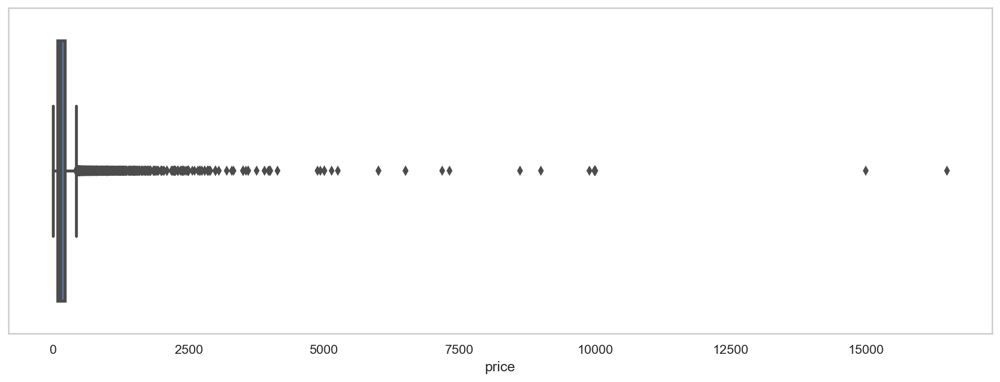

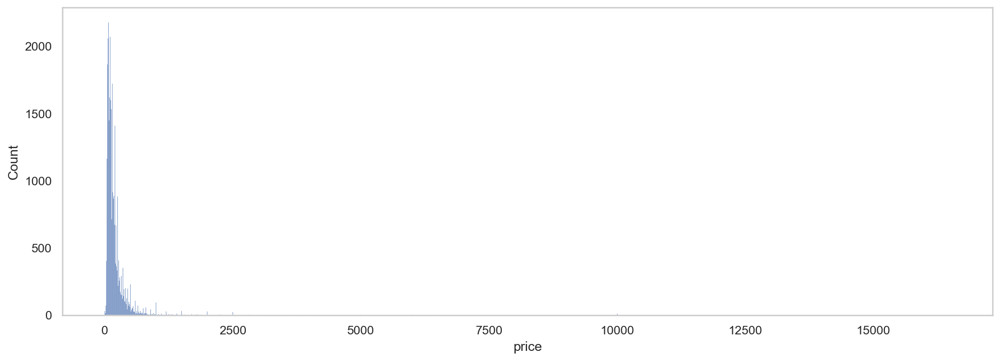

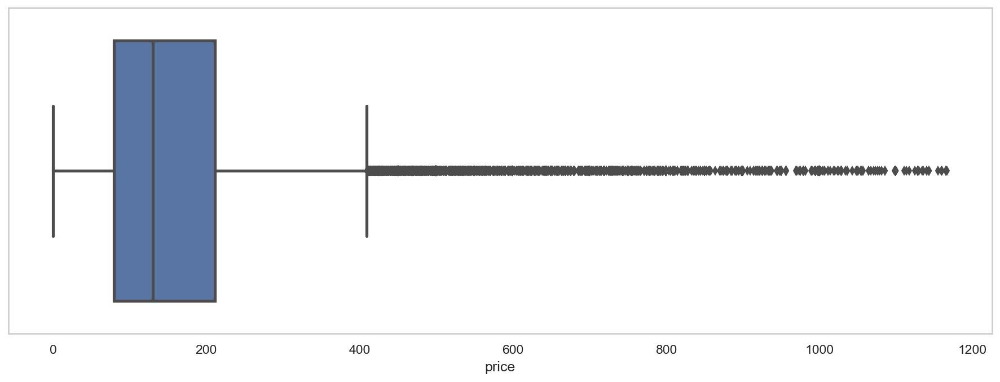

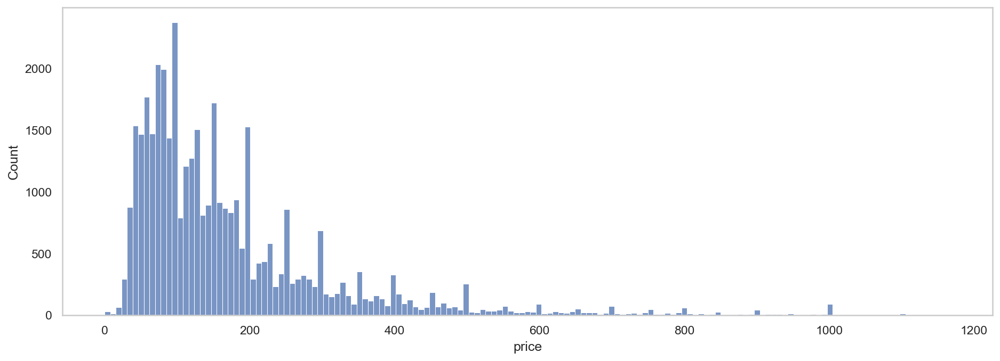

In [815]:
price = original_df.price.str.replace("$", "").str.replace(",", "").astype(float)

_ = plt.figure(figsize=(15, 5))
ax = sns.boxplot(price).grid(False)
plt.show()

_ = plt.figure(figsize=(15, 5))
ax = sns.histplot(price).grid(False)
plt.show()


price99 = price.where(price <= price.quantile(q=0.99))

_ = plt.figure(figsize=(15, 5))
ax = sns.boxplot(price99).grid(False)
plt.show()

_ = plt.figure(figsize=(15, 5))
ax = sns.histplot(price99).grid(False)
plt.show()

#### [ ] a. Bivariate Visualizations
##### [ ] a. Target Variable and Interesting Features
##### [ ] a. Correlation Heatmap

### [ ] 3. Data Collection Advantages and Disadvantages

### [ ] 4. Overcoming Data Collection Challenges

# Part III: Data Extraction and Preparation
---

### [ ] 1. Data Extraction
### [ ] 2. Data Tools and Techniques




### ✅ 3. Data Preparation

In [852]:
prep_df = original_df.copy()

#### ✅ a. Clean Text

In [853]:
# strip white space and lowercase amenities
prep_df["amenities"] = prep_df["amenities"].apply(lambda x: [amenity.lower().strip() for amenity in x])

# remove dropwords
prep_df["amenities"] = prep_df["amenities"].apply(lambda x: [amenity for amenity in x if amenity not in STOP_WORDS])

# remove non-word characters
prep_df["amenities"] = prep_df["amenities"].apply(lambda x: [re.sub("[^a-z-A-Z'\s]+", '', amenity) for amenity in x])

prep_df[["amenities"]].head()


,amenities
0,"[first aid kit, microwave, stove, coffee maker, long term stays allowed, carbon monoxide alarm, tv with standard cable, essentials, oven, hot water, outlet covers, heating, smoke alarm, fire extinguisher, free street parking, keypad, free parking on premises, extra pillows and blankets, cleaning before checkout, dishes and silverware, hair dryer, cable tv, refrigerator, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, elevator, shampoo, kitchen, dryer, washer, wifi]"
1,"[stove, coffee maker, long term stays allowed, carbon monoxide alarm, essentials, oven, dedicated workspace, hot water, heating, smoke alarm, fire extinguisher, free street parking, keypad, air conditioning, extra pillows and blankets, cleaning before checkout, paid parking off premises, dishes and silverware, baking sheet, hair dryer, bathtub, refrigerator, tv, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, ethernet connection, kitchen, wifi]"
2,"[heating, kitchen, air conditioning, wifi, long term stays allowed]"
3,"[hair dryer, essentials, carbon monoxide alarm, iron, backyard, cable tv, refrigerator, hot water, heating, smoke alarm, free street parking, long term stays allowed, kitchen, dryer, air conditioning, washer, pack un playtravel crib, wifi, coffee maker, tv with standard cable]"
4,"[hair dryer, cable tv, refrigerator, bbq grill, private fenced garden or backyard, heating, smoke alarm, long term stays allowed, kitchen, outdoor dining area, childrenus books and toys, dryer, air conditioning, washer, private patio or balcony, wifi, hdtv with hbo max, standard cable, roku, netflix, carbon monoxide alarm, outdoor furniture]"


#### ✅ a. Drop Irrelevant Columns

In [854]:
prep_df = prep_df[['id', 'scrape_id', 'amenities', 'price']]
prep_df.head()

,id,scrape_id,amenities,price
0,2539,20220907064715,"[first aid kit, microwave, stove, coffee maker, long term stays allowed, carbon monoxide alarm, tv with standard cable, essentials, oven, hot water, outlet covers, heating, smoke alarm, fire extinguisher, free street parking, keypad, free parking on premises, extra pillows and blankets, cleaning before checkout, dishes and silverware, hair dryer, cable tv, refrigerator, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, elevator, shampoo, kitchen, dryer, washer, wifi]",$299.00
1,2595,20220907064715,"[stove, coffee maker, long term stays allowed, carbon monoxide alarm, essentials, oven, dedicated workspace, hot water, heating, smoke alarm, fire extinguisher, free street parking, keypad, air conditioning, extra pillows and blankets, cleaning before checkout, paid parking off premises, dishes and silverware, baking sheet, hair dryer, bathtub, refrigerator, tv, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, ethernet connection, kitchen, wifi]",$175.00
2,5121,20220907064715,"[heating, kitchen, air conditioning, wifi, long term stays allowed]",$60.00
3,45910,20220907064715,"[hair dryer, essentials, carbon monoxide alarm, iron, backyard, cable tv, refrigerator, hot water, heating, smoke alarm, free street parking, long term stays allowed, kitchen, dryer, air conditioning, washer, pack un playtravel crib, wifi, coffee maker, tv with standard cable]",$425.00
4,5136,20220907064715,"[hair dryer, cable tv, refrigerator, bbq grill, private fenced garden or backyard, heating, smoke alarm, long term stays allowed, kitchen, outdoor dining area, childrenus books and toys, dryer, air conditioning, washer, private patio or balcony, wifi, hdtv with hbo max, standard cable, roku, netflix, carbon monoxide alarm, outdoor furniture]",$275.00


#### ✅ a. Format Price Feature

In [855]:
if prep_df.dtypes["price"] == "O":
    print("Converting price from Object to Float")
    prep_df.price = prep_df.price.str.replace("$", "").str.replace(",", "")

prep_df.price = prep_df.price.astype(float)

if prep_df.dtypes["price"] == "float64":
    print("Successful conversion")

prep_df[["price"]].head()

Converting price from Object to Float
Successful conversion


,price
0,299.00
1,175.00
2,60.00
3,425.00
4,275.00


#### ✅ a. Detect Duplicates 

In [856]:
try:
    dupes = prep_df.duplicated(subset=["id", "scrape_id"]).value_counts()

    if dupes.to_dict().get(False) == prep_df.shape[0]:
        print("no duplicates, dropping id columns")
        prep_df = prep_df.drop(columns=["id", "scrape_id"], errors="ignore")
        
except:
    pass

no duplicates, dropping id columns


#### ✅ a. Address Outliers

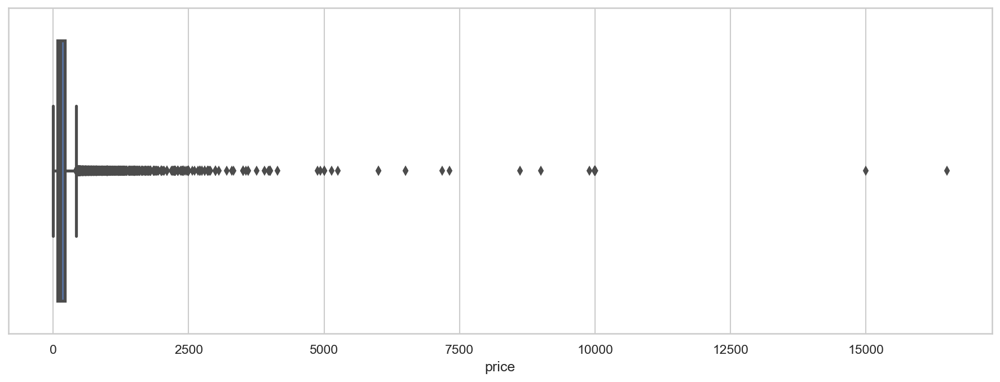

,price
count,39881.00
mean,197.55
std,353.33
min,0.00
25%,80.00
50%,130.00
75%,219.00
90%,364.00
95%,500.00
97%,650.00


In [857]:
_ = plt.figure(figsize=(15, 5))
ax = sns.boxplot(prep_df.price)
plt.show()

prep_df[["price"]].describe(percentiles=[0.25, 0.5, 0.75, 0.9, 0.95, 0.97, 0.98, 0.99])


In [858]:
prep_df["price_absz"] = abs(stats.zscore(prep_df.price))
prep_df[["price", "price_absz"]].sort_values(by="price_absz", ascending=False).head()

,price,price_absz
19208,16500.00,46.14
35901,15000.00,41.89
16551,10000.00,27.74
13005,10000.00,27.74
19820,10000.00,27.74


,price,price_absz
250,2500.00,6.52
713,2000.00,5.10
834,2500.00,6.52
913,1286.00,3.08
1129,2700.00,7.08


,price,price_absz
count,341.00,341.00
mean,2684.77,7.04
std,2368.38,6.70
min,1258.00,3.00
25%,1500.00,3.69
50%,1871.00,4.74
75%,2500.00,6.52
max,16500.00,46.14


<AxesSubplot:xlabel='price', ylabel='Density'>

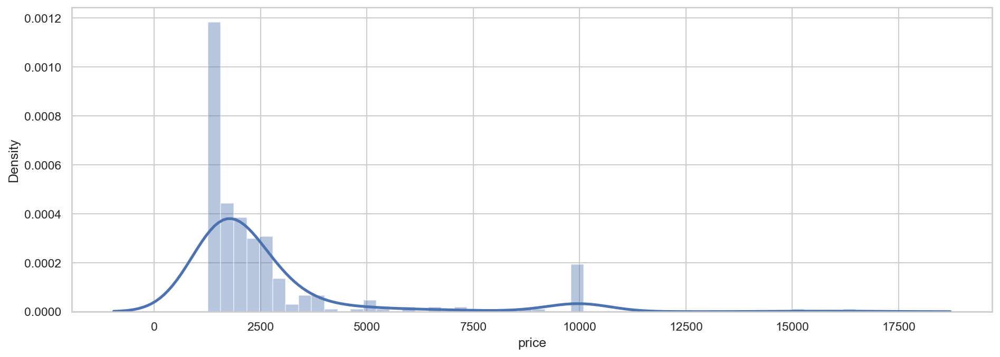

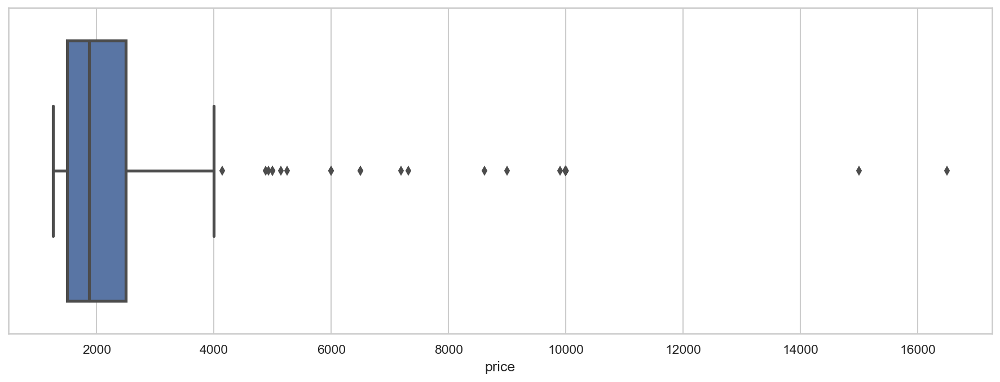

In [859]:
outlier_df = prep_df.loc[prep_df.price_absz >= 3, ["price", "price_absz"]]

outlier_df.head()
outlier_df.describe()

_ = plt.figure(figsize=(15, 5))
sns.distplot(outlier_df.price, kde=True)

_ = plt.figure(figsize=(15, 5))
ax = sns.boxplot(outlier_df.price)

##### Visualize Outliers

,amenities,price,price_absz
0,"[first aid kit, microwave, stove, coffee maker, long term stays allowed, carbon monoxide alarm, tv with standard cable, essentials, oven, hot water, outlet covers, heating, smoke alarm, fire extinguisher, free street parking, keypad, free parking on premises, extra pillows and blankets, cleaning before checkout, dishes and silverware, hair dryer, cable tv, refrigerator, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, elevator, shampoo, kitchen, dryer, washer, wifi]",299.00,0.29
1,"[stove, coffee maker, long term stays allowed, carbon monoxide alarm, essentials, oven, dedicated workspace, hot water, heating, smoke alarm, fire extinguisher, free street parking, keypad, air conditioning, extra pillows and blankets, cleaning before checkout, paid parking off premises, dishes and silverware, baking sheet, hair dryer, bathtub, refrigerator, tv, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, ethernet connection, kitchen, wifi]",175.00,0.06
2,"[heating, kitchen, air conditioning, wifi, long term stays allowed]",60.00,0.39
3,"[hair dryer, essentials, carbon monoxide alarm, iron, backyard, cable tv, refrigerator, hot water, heating, smoke alarm, free street parking, long term stays allowed, kitchen, dryer, air conditioning, washer, pack un playtravel crib, wifi, coffee maker, tv with standard cable]",425.00,0.64
4,"[hair dryer, cable tv, refrigerator, bbq grill, private fenced garden or backyard, heating, smoke alarm, long term stays allowed, kitchen, outdoor dining area, childrenus books and toys, dryer, air conditioning, washer, private patio or balcony, wifi, hdtv with hbo max, standard cable, roku, netflix, carbon monoxide alarm, outdoor furniture]",275.00,0.22


,price,price_absz
count,39540.00,39540.00
mean,176.10,0.32
std,154.51,0.31
min,0.00,0.00
25%,80.00,0.15
50%,130.00,0.28
75%,213.00,0.39
max,1257.00,3.00


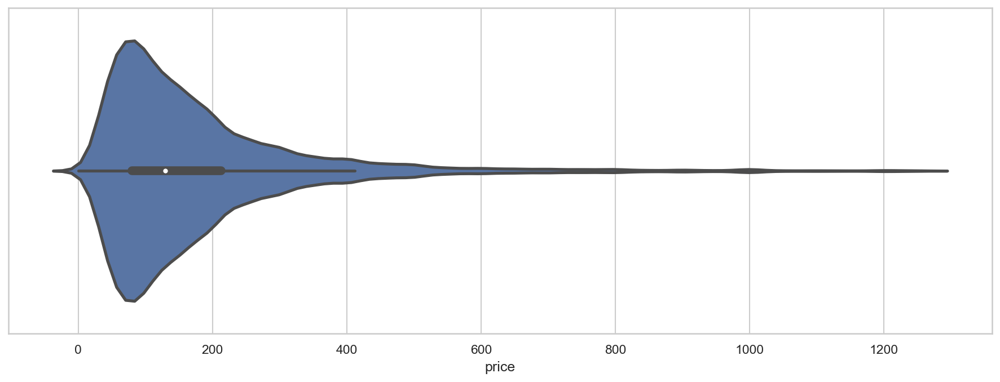

In [860]:
prep_df = prep_df.loc[prep_df.price_absz < 3]

prep_df.head()
prep_df.describe()

_ = plt.figure(figsize=(15, 5))
ax = sns.violinplot(prep_df.price)
plt.show()


In [861]:
prep_df.head()

,amenities,price,price_absz
0,"[first aid kit, microwave, stove, coffee maker, long term stays allowed, carbon monoxide alarm, tv with standard cable, essentials, oven, hot water, outlet covers, heating, smoke alarm, fire extinguisher, free street parking, keypad, free parking on premises, extra pillows and blankets, cleaning before checkout, dishes and silverware, hair dryer, cable tv, refrigerator, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, elevator, shampoo, kitchen, dryer, washer, wifi]",299.00,0.29
1,"[stove, coffee maker, long term stays allowed, carbon monoxide alarm, essentials, oven, dedicated workspace, hot water, heating, smoke alarm, fire extinguisher, free street parking, keypad, air conditioning, extra pillows and blankets, cleaning before checkout, paid parking off premises, dishes and silverware, baking sheet, hair dryer, bathtub, refrigerator, tv, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, ethernet connection, kitchen, wifi]",175.00,0.06
2,"[heating, kitchen, air conditioning, wifi, long term stays allowed]",60.00,0.39
3,"[hair dryer, essentials, carbon monoxide alarm, iron, backyard, cable tv, refrigerator, hot water, heating, smoke alarm, free street parking, long term stays allowed, kitchen, dryer, air conditioning, washer, pack un playtravel crib, wifi, coffee maker, tv with standard cable]",425.00,0.64
4,"[hair dryer, cable tv, refrigerator, bbq grill, private fenced garden or backyard, heating, smoke alarm, long term stays allowed, kitchen, outdoor dining area, childrenus books and toys, dryer, air conditioning, washer, private patio or balcony, wifi, hdtv with hbo max, standard cable, roku, netflix, carbon monoxide alarm, outdoor furniture]",275.00,0.22


#### ✅ a. Drop/Impute Missing Values

In [862]:
prep_df = prep_df.dropna()

display(pd.DataFrame(prep_df[prep_df.columns].isnull().sum(), columns=["# Nulls"]))

f"{prep_df.isnull().sum().sum():,} Total Null Values"


,# Nulls
amenities,0
price,0
price_absz,0


'0 Total Null Values'

#### ✅ a. Convert Features to Columns

In [863]:
# create a string from amenities list
prep_df["amenities_str"] = prep_df.amenities.apply(lambda x: ", ".join(x))
prep_df[["amenities_str"]].head()



,amenities_str
0,"first aid kit, microwave, stove, coffee maker, long term stays allowed, carbon monoxide alarm, tv with standard cable, essentials, oven, hot water, outlet covers, heating, smoke alarm, fire extinguisher, free street parking, keypad, free parking on premises, extra pillows and blankets, cleaning before checkout, dishes and silverware, hair dryer, cable tv, refrigerator, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, elevator, shampoo, kitchen, dryer, washer, wifi"
1,"stove, coffee maker, long term stays allowed, carbon monoxide alarm, essentials, oven, dedicated workspace, hot water, heating, smoke alarm, fire extinguisher, free street parking, keypad, air conditioning, extra pillows and blankets, cleaning before checkout, paid parking off premises, dishes and silverware, baking sheet, hair dryer, bathtub, refrigerator, tv, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, ethernet connection, kitchen, wifi"
2,"heating, kitchen, air conditioning, wifi, long term stays allowed"
3,"hair dryer, essentials, carbon monoxide alarm, iron, backyard, cable tv, refrigerator, hot water, heating, smoke alarm, free street parking, long term stays allowed, kitchen, dryer, air conditioning, washer, pack un playtravel crib, wifi, coffee maker, tv with standard cable"
4,"hair dryer, cable tv, refrigerator, bbq grill, private fenced garden or backyard, heating, smoke alarm, long term stays allowed, kitchen, outdoor dining area, childrenus books and toys, dryer, air conditioning, washer, private patio or balcony, wifi, hdtv with hbo max, standard cable, roku, netflix, carbon monoxide alarm, outdoor furniture"


##### Count Vector

In [864]:
cv = CountVectorizer(stop_words='english') 
cv_matrix = cv.fit_transform(prep_df.amenities_str) 

words = cv.get_feature_names() 
counts = cv_matrix.toarray().sum(axis=0)

pd.DataFrame(zip(words, counts), columns=["word", "freq"]).sort_values(by="freq", ascending=False).head(10)


,word,freq
34,alarm,65913
42,allowed,44208
492,dryer,40340
1753,wifi,39180
1598,term,35711
964,long,35711
1535,stays,35711
742,heating,35655
1488,smoke,35542
900,kitchen,35143


##### One-Hot Encode Features

In [865]:
# add one-hot amenities columns
prep_df[['shampoo_conditioner', 'internet', 'dryer', 'washer', 'heating',
       'stove', 'microwave', 'coffee', 'first_aid', 'kitchen', 'iron', 'tv',
       'free_parking', 'elevator', 'kitchenware', 'waterfront_beachfront',
       'luggage_dropoff', 'longterm_stay', 'cooling', 'crib', 'bbq_grill',
       'tv_streaming', 'balcony_patio', 'privacy', 'gym', 'body_soap',
       'refridgerator', 'toaster', 'dishwasher', 'lockbox_safe',
       'security_camera', 'sound_system', 'fireplace', 'pool', 'game_console',
         'bikes', 'extra_bedding', 'highchair', 'babygate']] = 0

for index, amenities in enumerate(prep_df.amenities_str):
    # skip invalid amenities
    if not amenities or not isinstance(amenities, str):
        continue    
    
    # map amenity text to data feature
    try:
        if re.search(r"(shampoo|conditioner)", amenities):
            prep_df.loc[index, "shampoo_conditioner"] = 1
            
        if re.search(r"body\s(soap|wash)|(shower\sgel)", amenities):
            prep_df.loc[index, "body_soap"] = 1    
            
        if re.search(r"^bath(tub)?$", amenities):
            prep_df.loc[index, "bathtub"] = 1                                    
            
        if re.search(r"wi-?fi|ethernet|internet", amenities):
            prep_df.loc[index, "internet"] = 1  
            
        if re.search(r"(dryer|laundromat)", amenities):
            prep_df.loc[index, "dryer"] = 1   

        if re.search(r"(washer|laundromat)", amenities):
            prep_df.loc[index, "washer"] = 1    

        if re.search(r"fridge", amenities):
            prep_df.loc[index, "refridgerator"] = 1               
            
        if re.search(r"(heating|heater)", amenities):
            prep_df.loc[index, "heating"] = 1  
            
        if re.search(r"(cooling|air\sconditioning|ac\sunit)", amenities):
            prep_df.loc[index, "cooling"] = 1              
            
        if re.search(r"stove", amenities):
            prep_df.loc[index, "stove"] = 1  
            
        if re.search(r"toaster", amenities):
            prep_df.loc[index, "toaster"] = 1              
            
        if re.search(r"microwave", amenities):
            prep_df.loc[index, "microwave"] = 1  
            
        if re.search(r"(bbq|grill|barbeque)", amenities):
            prep_df.loc[index, "bbq_grill"] = 1   
            
        if re.search(r"(coffee|espresso|keurig)", amenities):
            prep_df.loc[index, "coffee"] = 1      
            
        if re.search(r"aide?\s(kit)?", amenities):
            prep_df.loc[index, "first_aid"] = 1   
            
        if re.search(r"kitchen", amenities):
            prep_df.loc[index, "kitchen"] = 1  
            
        if re.search(r"dishwasher", amenities):
            prep_df.loc[index, "dishwasher"] = 1   
            
        if re.search(r"(roku|amazon\sprime|hbo\smax|netflix)", amenities):
            prep_df.loc[index, "tv_streaming"] = 1  
            
        if re.search(r"(x-?box|wii|ps\d|playstation|nintendo)", amenities):
            prep_df.loc[index, "game_console"] = 1  
                        
        if re.search(r"iron", amenities):
            prep_df.loc[index, "iron"] = 1  

        if re.search(r"pool", amenities):
            prep_df.loc[index, "pool"] = 1               
            
        if re.search(r"(tv|television)", amenities):
            prep_df.loc[index, "tv"] = 1      
            
        if re.search(r"free.*parking", amenities):
            prep_df.loc[index, "free_parking"] = 1    
            
        if re.search(r"(portable)?\sfan", amenities):
            prep_df.loc[index, "free_parking"] = 1   
            
        if re.search(r"(balcony|patio)", amenities):
            prep_df.loc[index, "balcony_patio"] = 1   
            
        if re.search(r"(lock(\s)?box|safe)", amenities):
            prep_df.loc[index, "lockbox_safe"] = 1    
            
        if re.search(r"elevator", amenities):
            prep_df.loc[index, "elevator"] = 1  
            
        if re.search(r"gym", amenities):
            prep_df.loc[index, "gym"] = 1 
            
        if re.search(r"(sound\ssystem|woofer)", amenities):
            prep_df.loc[index, "sound_system"] = 1   
            
        if re.search(r"(silver|dinner)ware|dishes|cooking\sbasics", amenities):
            prep_df.loc[index, "kitchenware"] = 1  
            
        if re.search(r"(beach|water|lake)(front)?", amenities):
            prep_df.loc[index, "waterfront_beachfront"] = 1 
            
        if re.search(r"(security\scamera)", amenities):
            prep_df.loc[index, "security_camera"] = 1  
            
        if re.search(r"crib", amenities):
            prep_df.loc[index, "crib"] = 1   
            
        if re.search(r"high(\s)?chair", amenities):
            prep_df.loc[index, "highchair"] = 1  
            
        if re.search(r"baby.*gate", amenities):
            prep_df.loc[index, "babygate"] = 1              
            
        if re.search(r"luggage\sdropoff", amenities):
            prep_df.loc[index, "luggage_dropoff"] = 1    
            
        if re.search(r"long\sterm\sstays\sallowed", amenities):
            prep_df.loc[index, "longterm_stay"] = 1                
                    
        if re.search(r"extra\s(pillow|blanket)", amenities):
            prep_df.loc[index, "extra_bedding"] = 1  
            
        if re.search(r"(clothing\sstorage|closet|hanger)", amenities):
            prep_df.loc[index, "longterm_stay"] = 1 
            
        if re.search(r"bike", amenities):
            prep_df.loc[index, "bikes"] = 1 
            
        if re.search(r"fire.*place", amenities):
            prep_df.loc[index, "fireplace"] = 1  
            
        if re.search(r"private|privacy", amenities):
            prep_df.loc[index, "privacy"] = 1                                   
                                    
    except Exception as e:
        print(f"{amenities = }") 
        print(f"{e = }")         
        break
              
    
prep_df.head().T

,0,1,2,3,4
amenities,"[first aid kit, microwave, stove, coffee maker, long term stays allowed, carbon monoxide alarm, tv with standard cable, essentials, oven, hot water, outlet covers, heating, smoke alarm, fire extinguisher, free street parking, keypad, free parking on premises, extra pillows and blankets, cleaning before checkout, dishes and silverware, hair dryer, cable tv, refrigerator, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, elevator, shampoo, kitchen, dryer, washer, wifi]","[stove, coffee maker, long term stays allowed, carbon monoxide alarm, essentials, oven, dedicated workspace, hot water, heating, smoke alarm, fire extinguisher, free street parking, keypad, air conditioning, extra pillows and blankets, cleaning before checkout, paid parking off premises, dishes and silverware, baking sheet, hair dryer, bathtub, refrigerator, tv, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, ethernet connection, kitchen, wifi]","[heating, kitchen, air conditioning, wifi, long term stays allowed]","[hair dryer, essentials, carbon monoxide alarm, iron, backyard, cable tv, refrigerator, hot water, heating, smoke alarm, free street parking, long term stays allowed, kitchen, dryer, air conditioning, washer, pack un playtravel crib, wifi, coffee maker, tv with standard cable]","[hair dryer, cable tv, refrigerator, bbq grill, private fenced garden or backyard, heating, smoke alarm, long term stays allowed, kitchen, outdoor dining area, childrenus books and toys, dryer, air conditioning, washer, private patio or balcony, wifi, hdtv with hbo max, standard cable, roku, netflix, carbon monoxide alarm, outdoor furniture]"
price,299.00,175.00,60.00,425.00,275.00
price_absz,0.29,0.06,0.39,0.64,0.22
amenities_str,"first aid kit, microwave, stove, coffee maker, long term stays allowed, carbon monoxide alarm, tv with standard cable, essentials, oven, hot water, outlet covers, heating, smoke alarm, fire extinguisher, free street parking, keypad, free parking on premises, extra pillows and blankets, cleaning before checkout, dishes and silverware, hair dryer, cable tv, refrigerator, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, elevator, shampoo, kitchen, dryer, washer, wifi","stove, coffee maker, long term stays allowed, carbon monoxide alarm, essentials, oven, dedicated workspace, hot water, heating, smoke alarm, fire extinguisher, free street parking, keypad, air conditioning, extra pillows and blankets, cleaning before checkout, paid parking off premises, dishes and silverware, baking sheet, hair dryer, bathtub, refrigerator, tv, bed linens, cooking basics, hangers, luggage dropoff allowed, iron, ethernet connection, kitchen, wifi","heating, kitchen, air conditioning, wifi, long term stays allowed","hair dryer, essentials, carbon monoxide alarm, iron, backyard, cable tv, refrigerator, hot water, heating, smoke alarm, free street parking, long term stays allowed, kitchen, dryer, air conditioning, washer, pack un playtravel crib, wifi, coffee maker, tv with standard cable","hair dryer, cable tv, refrigerator, bbq grill, private fenced garden or backyard, heating, smoke alarm, long term stays allowed, kitchen, outdoor dining area, childrenus books and toys, dryer, air conditioning, washer, private patio or balcony, wifi, hdtv with hbo max, standard cable, roku, netflix, carbon monoxide alarm, outdoor furniture"
shampoo_conditioner,1.00,0.00,0.00,0.00,0.00
internet,1.00,1.00,1.00,1.00,1.00
dryer,1.00,1.00,0.00,1.00,1.00
washer,1.00,0.00,0.00,1.00,1.00
heating,1.00,1.00,1.00,1.00,1.00
stove,1.00,1.00,0.00,0.00,0.00


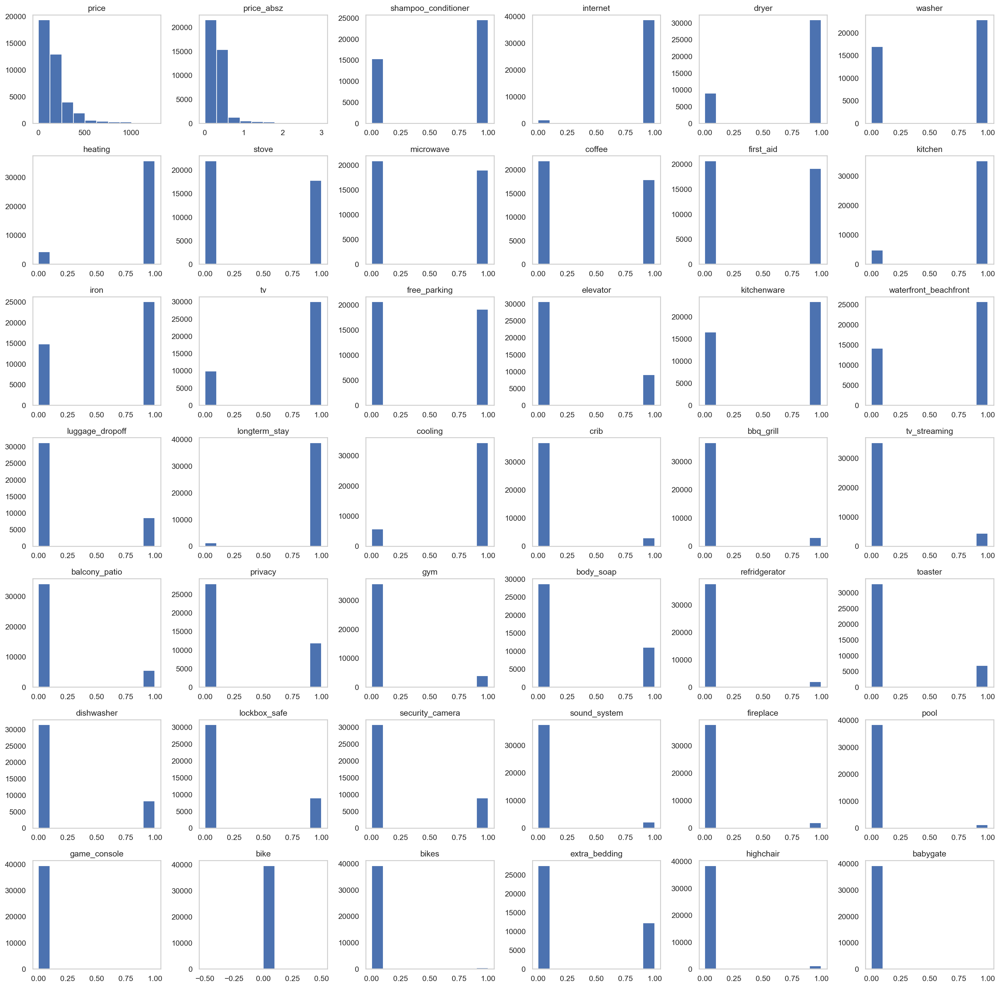

In [866]:
_ = prep_df.hist(figsize=(25,25), grid=False)

In [772]:
pd.DataFrame(prep_df.skew(), columns=["skew"]).sort_values(by="skew")

,skew
longterm_stay,-6.72
internet,-6.41
heating,-2.68
kitchen,-2.45
cooling,-2.14
dryer,-1.35
tv,-1.20
waterfront_beachfront,-0.62
iron,-0.55
shampoo_conditioner,-0.49


#### ✅ a. Train/Test Split

In [867]:
output_df = prep_df.copy()
output_df = output_df.drop(columns=["id", "scrape_id", "amenities", "price_absz", "amenities_str"], errors="ignore")

X = output_df.drop(columns=["price"])
y = output_df[["price"]]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=RANDOM_STATE
)

train_df = pd.concat([X_train, y_train], axis=1, ignore_index=False)
train_df.head(1).T

test_df = pd.concat([X_test, y_test], axis=1, ignore_index=False)
test_df.head(1).T


,25357
shampoo_conditioner,0.00
internet,1.00
dryer,1.00
washer,0.00
heating,1.00
stove,1.00
microwave,1.00
coffee,1.00
first_aid,0.00
kitchen,1.00


,34452
shampoo_conditioner,0.00
internet,1.00
dryer,0.00
washer,1.00
heating,0.00
stove,0.00
microwave,0.00
coffee,0.00
first_aid,1.00
kitchen,1.00


#### ✅ a. Output to CSVs

In [781]:
output_df.to_csv("./listings_prepared.csv", index=False)
train_df.to_csv("./listings_prepared_train.csv", index=False)
test_df.to_csv("./listings_prepared_test.csv", index=False)

output_df.head(1).T
train_df.head(1).T
test_df.head(1).T

,0
price,299.00
shampoo_conditioner,1.00
internet,1.00
dryer,1.00
washer,1.00
heating,1.00
stove,1.00
microwave,1.00
coffee,1.00
first_aid,1.00


,35341
shampoo_conditioner,0.00
internet,1.00
dryer,0.00
washer,1.00
heating,1.00
stove,0.00
microwave,0.00
coffee,1.00
first_aid,1.00
kitchen,1.00


,39654
shampoo_conditioner,1.00
internet,1.00
dryer,1.00
washer,0.00
heating,1.00
stove,1.00
microwave,1.00
coffee,1.00
first_aid,1.00
kitchen,1.00


### ✅ 3. Post Data Prep Visualizations

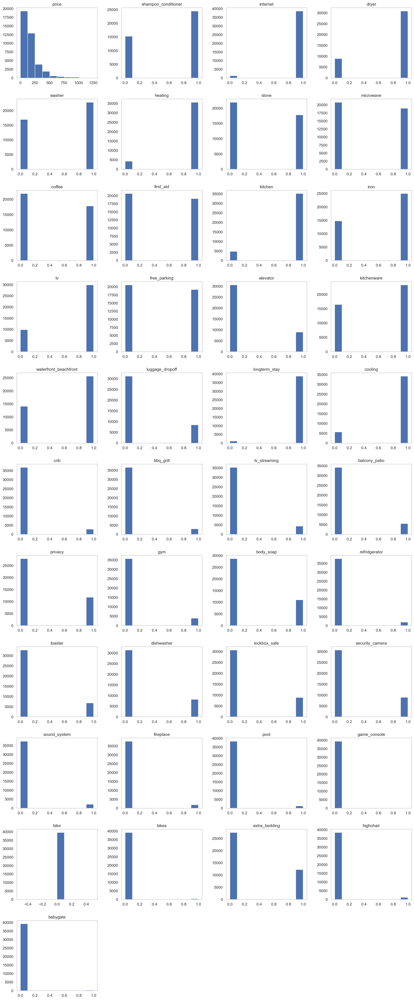

In [868]:
ax = output_df.hist(layout=(11, 4), figsize=(20,50), grid=False)

<AxesSubplot:xlabel='price'>

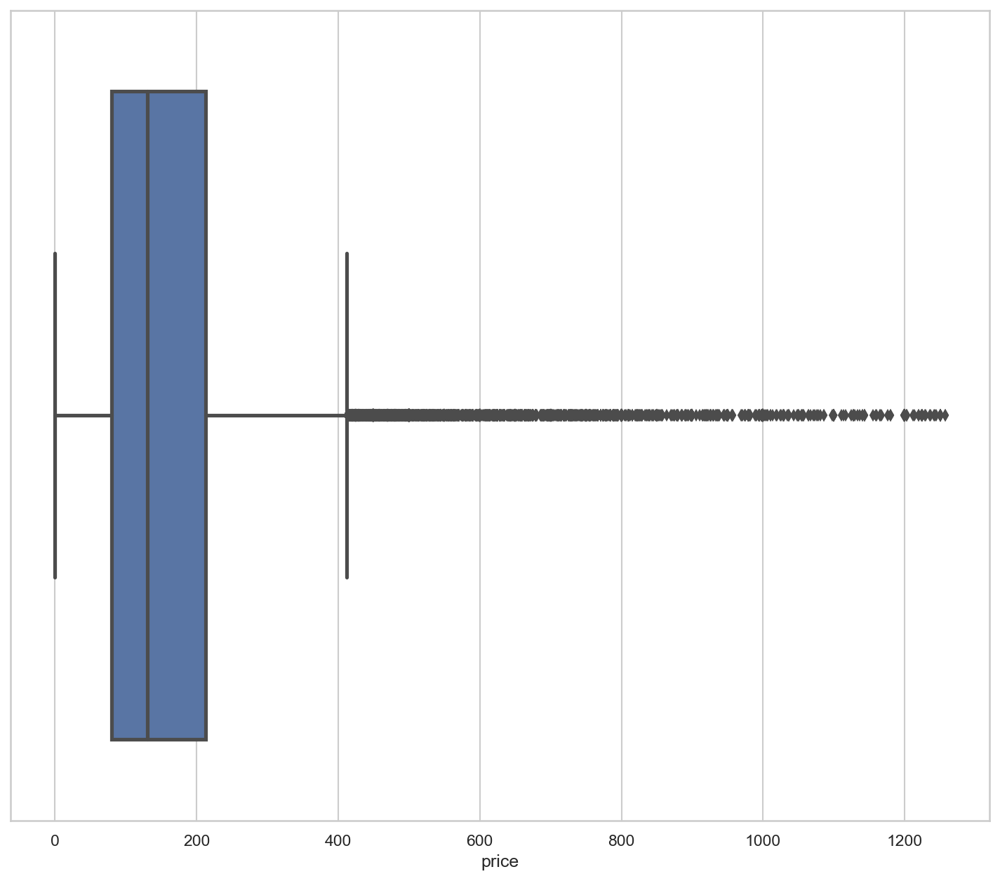

In [869]:
sns.boxplot(x=output_df.price)

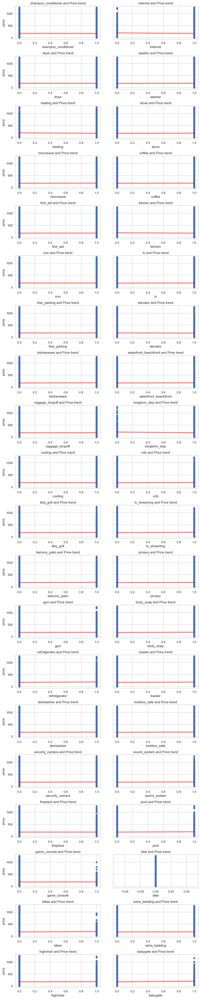

In [893]:
x_cols = output_df.columns[~output_df.columns.isin(["price"])]

import math

ncols = 2
fig, axs = plt.subplots(nrows=math.ceil(len(x_cols)/ncols), ncols=ncols, figsize=(10, 50), sharey=True)
fig.tight_layout()


plt.subplots_adjust(hspace=0.5, wspace=0.15)

for col, ax in zip(x_cols, [p for ax in axs for p in ax]):
    _ = sns.scatterplot(x=col, y="price", data=output_df, ax=ax)

    # trendline
    _ = sns.regplot(
        x=col,
        y="price",
        data=output_df,
        ci=None,
        ax=ax,
        line_kws={"alpha": 0.5, "color": "red"},
    )

    ax.title.set_text(f"{col} and Price trend")


Text(0.5, 1.0, 'Age and Additional Charges x High Blood Pressure')

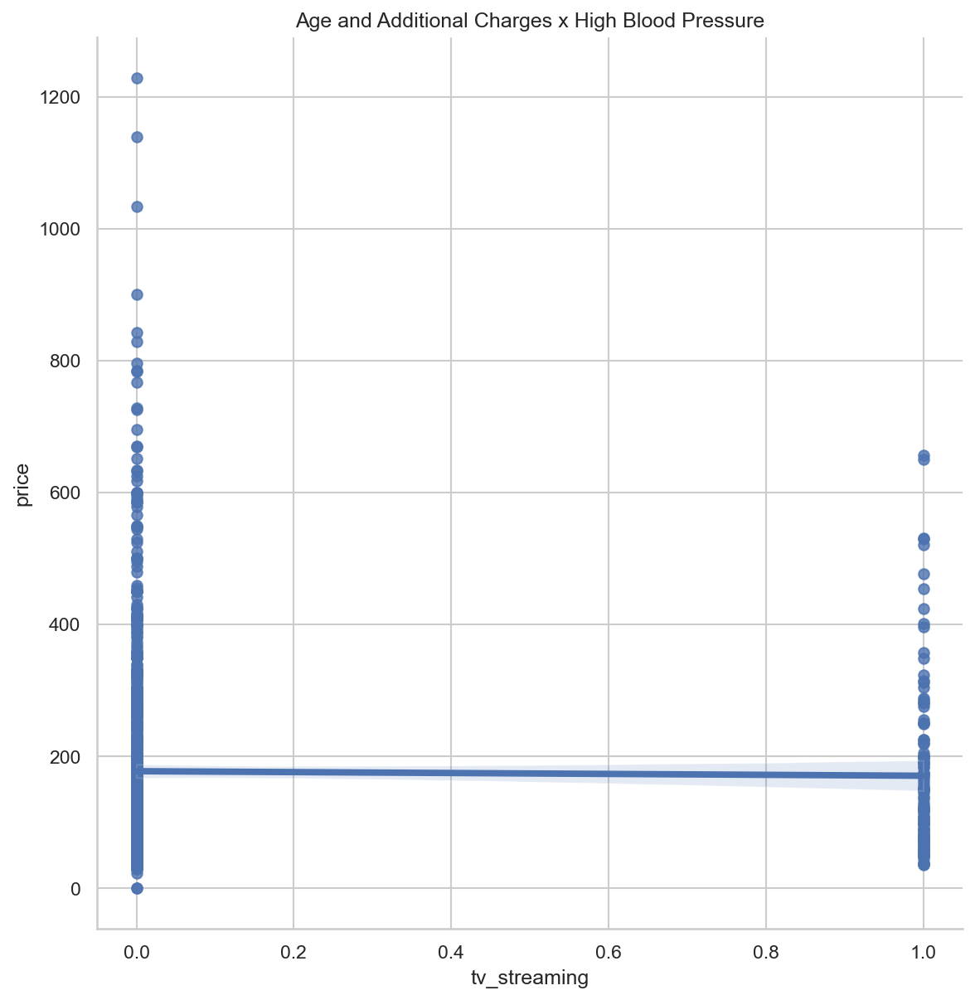

In [896]:
fig = sns.lmplot(
    x="tv_streaming", y="price", data=output_df.sample(1000), height=8
)

plt.title("Age and Additional Charges x High Blood Pressure")

In [899]:
def create_heatmap(data, figsize=(50, 40), title="DataFrame Correlation Heatmap"):
    plt.figure(figsize=figsize)

    mask = np.triu(np.ones_like(data.corr(), dtype=bool))

    heatmap = sns.heatmap(
        data.corr(),
        mask=mask,
        vmin=-1,
        vmax=1,
        annot=True,
        annot_kws={"fontsize": 24},
        fmt=".1f",
    )
    heatmap.set_xticklabels(heatmap.get_xmajorticklabels(), fontsize=48)
    heatmap.set_yticklabels(heatmap.get_ymajorticklabels(), fontsize=48)
    heatmap.set_title(title, fontdict={"fontsize": 75}, pad=2)


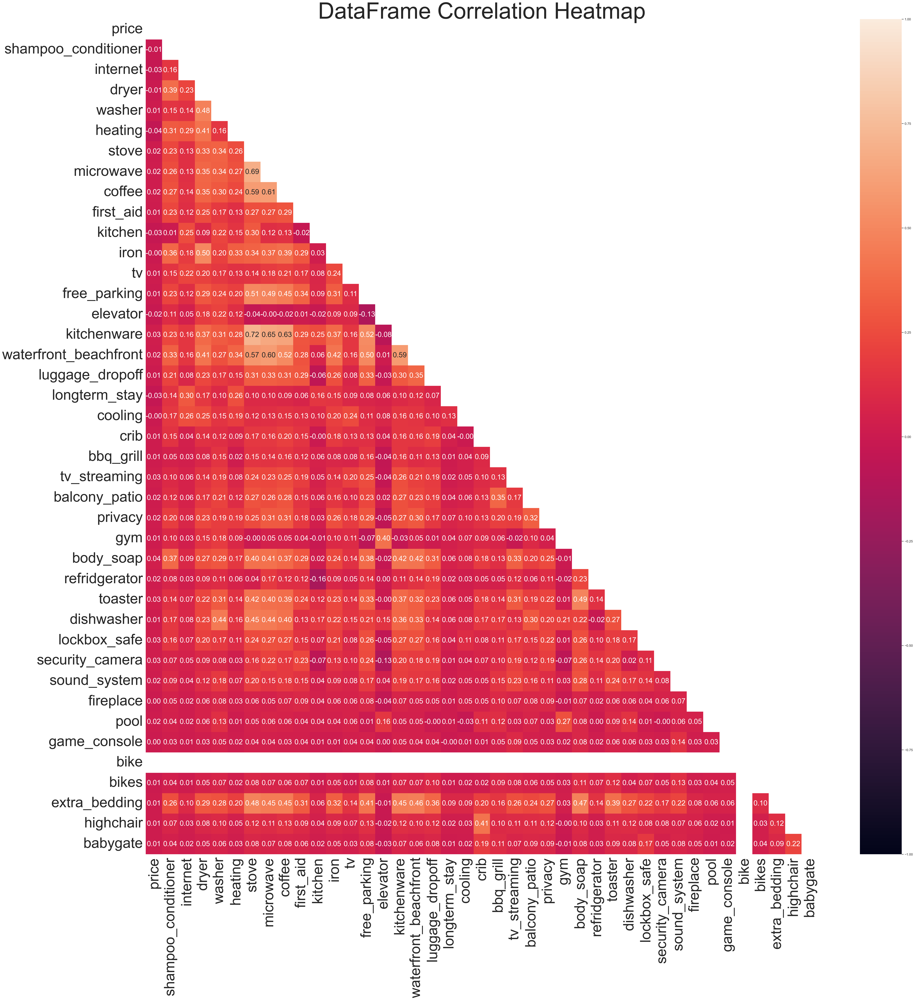

In [903]:
create_heatmap(data=output_df, figsize=(50, 50))

# Part IV: Analysis
---

### [ ] 1. Analysis Process
#### [ ] a. Model Comparison
### [ ] 2. Analysis Techniques
#### [ ] a. Feature Selection
##### [ ] a. Variance Inflation Factor
##### [ ] a. Recursive Feature Selection
##### [ ] a. ElasticNet
### [ ] 3. Analysis Technique Justification


# Part V: Data Summary and Implications
---

### [ ] 1. Analysis Results
#### [ ] a. Model Evaluation Metrics
#### [ ] a. Original Model Summary
#### [ ] a. Original Model Predictions
#### [ ] a. Final Model Summary
#### [ ] a. Final Model Summary
#### [ ] a. Residuals QQ Plot
#### [ ] a. Residuals Plots
#### [ ] a. Model Summary
#### [ ] a. Model Summary
#### [ ] a. Model Summary
#### [ ] a. Model Summary
### [ ] 2. Analysis Limitations
### [ ] 3. Recommended Course of Action


# Web Sources and References
---

### [ ] 1. Web Sources
- https://stackoverflow.com/questions/32742976/how-to-read-a-column-of-csv-as-dtype-list-using-pandas
### [ ] 2. References

## A.  Describe the purpose of this data analysis by doing the following:

### 1.  Summarize one research question that is relevant to a real-world organizational situation captured in the data set you have selected and that you will answer using multiple regression.
*The summary includes 1 research question that is relevant to a realistic organizational situation and can be addressed using the selected data set and multiple regression.*
<br />*The scenarios described on page 1 of both the churn dataset and the medical dataset are just examples. Even though these say, "You have been asked to..." it does not mean that you should use the example scenario as the basis for your analysis in D208.*

> Based on the Medical Readmission dataset, can we predict a patient's additional medical charges based on a patient's demographics and pre-existing health conditions? The Null Hypothesis is that a patient's demographics and pre-existing health conditions do not influence a patient's additional medical charges. The Alternative Hypothesis is that a patient's demographics and pre-existing health conditions likely influence a patient's additional medical charges. We'll test this hypothesis using multiple linear regression.

### 2.  Define the objectives or goals of the data analysis. Ensure that your objectives or goals are reasonable within the scope of the data dictionary and are represented in the available data.
*The submission defines the objectives or goals of the data analysis, and the objectives or goals are reasonable for the scope of the scenario and are represented in the available data.*

> There are several key objectives for this data analysis. The primary objective is to create a model that models a linear relationship between a patient's additional medical charges (dependent variable) and multiple independent variables related to a patient's demographics and health conditions. Additional medical charges can occur for a multitude of reasons, so this model will determine what — if any — relationship exists between the patient's data and additional charges. Furthermore, we'll determine if several explanatory variables can approximate a patient's additional medical charges.

> Ultimately the goal is to provide patients and healthcare providers with more accurate cost estimates. Additionally, if this model proves accurate, it will provide data to inform patients as to what factors — if any — may result in additional medical charges.


# Part II: Method Justification
---

## B.  Describe multiple regression methods by doing the following:

### 1.  Summarize the assumptions of a multiple regression model.
*The submission accurately summarizes the assumptions of a multiple regression model.*



> There are several assumptions about a multiple regression model. First, we expect a linear relationship between the target and explanatory variables where the model's explanatory power increases with the number of explanatory variables. Secondly, data observations are selected independently and randomly from the population using statistically valid methods (Bevans, 2020). Additionally, the explanatory variables are not highly correlated, meaning there is no relationship or collinearity among independent variables (Bevans, 2020). Next, we expect that the data follow a normal distribution. We expect the model to produce a straight regression line through the data points with residuals normally distributed with a mean of 0. Lastly, we anticipate consistent homoscedasticity throughout the independent variables.


### 2.  Describe the benefits of using the tool(s) you have chosen (i.e., Python, R, or both) in support of various phases of the analysis.
*The submission describes the benefits of using the tool(s) chosen in support of various phases of the multiple regression analysis, and the benefits logically align with the goal of the analysis.*



> We'll use several tools and technologies to support the multiple regression analysis. The primary tools we'll discuss are Jupyter Notebooks, NumPy, Matplotlib, Pandas, Python, Seaborn, Scikit-Learn, and Statsmodels.

> Jupyter Notebooks is beneficial because it offers seamless integration of python, data visualizations, and text documentation. Ultimately this offers human-readable and executable documents used to perform data analysis (Ingargiola, A., & contributors, 2015).

> NumPy is beneficial because it serves as the de-facto Python Numerical programming package. NumPy is easy to use, offers extensive computing tools, and is optimized to work well on large data sets.

> Matplotlib is a comprehensive library for creating visualizations in Python. Matplotlib offers a diverse set of visualization offers, but we're mainly going to leverage its plotting functionality to better understand our data set and evaluate the model. 

> Pandas' manipulation and analysis functionality are immensely beneficial. More specifically, it provides a user-friendly API for interacting with, manipulating, and performing operations on various data structures and tabular data (Pandas, 2022). 

> I'm familiar with Python and currently use it every day at work. I’m familiar with the programming ecosystem, its libraries, and its tools.

> Scikit-learn is a machine learning library that provides tools for model fitting, data preprocessing, model selection, model evaluation, and many other utilities (scikit-learn developers, 2021). We'll use this package's modules to create a linear regression model, select independent variables and standardize the data.

> Like Matplotlib, Seaborn is beneficial because it's based on matplotlib and offers features to make data visualizations more attractive.

> Statsmodels is beneficial because it provides functionality for estimating various statistical models and performing statistical tests and exploration. We'll use this package primarily to supplement Scikit-Learn and calculate the Variance Inflation Factor of our independent variables (Perktold et al., 2018).

### 3.  Explain why multiple regression is an appropriate technique to analyze the research question summarized in Part I.
*The submission accurately explains why multiple regression is an appropriate technique to analyze the research question from Part I.*


> Multiple regression is an appropriate data analysis technique for this research question for several reasons. Simple linear regression only allows for a single explanatory variable, limiting our prediction accuracy (Stojiljković, 2021). Conversely, multiple regression determines if and how much multiple explanatory variables influence a target variable (Bevans, 2020). Which ultimately illustrates the relationship strength between two or more independent variables and one dependent variable. Furthermore, multiple regression provides flexibility. Our research question seeks to determine if we can predict a patient's additional medical charges based on a patient's demographics and pre-existing health conditions. We know this question requires several explanatory variables of different data types. Multiple regression allows for continuous, discrete, or even categorical explanatory variables and a continuous target variable (Stojiljković, 2021). Lastly, it's a straightforward data model to create, evaluate, interpret, and explain.

# Part III: Data Preparation
---

## C.  Summarize the data preparation process for multiple regression analysis by doing the following:



### 1.  Describe your data preparation goals and the data manipulations that will be used to achieve the goals.
*The submission describes the data preparation goals and the data manipulations that will be used to achieve the goals. The goals and manipulations align with each other and with multiple regression analysis and the research question.*


In [706]:
original_df = pd.read_csv(
    "../TASK 1 - MULTIPLE REGRESSION FOR PREDICTIVE MODELING/src/medical_clean.csv"
)


In [707]:
df = pd.read_csv(
    "../TASK 1 - MULTIPLE REGRESSION FOR PREDICTIVE MODELING/src/medical_clean.csv"
)


#### Data Prep Goals and Data Manipulations
> Creating an initial linear regression model requires several data preparation steps and manipulations. First, we'll remove unneeded data features such as geographic information, survey responses, and other metadata and IDs. Next, we'll check for missing values and remove the records or impute the values using a mean value. Then, we'll convert nominal data features into categorical values and one-hot encode these features into K-1 columns. Additionally, we may need to standardize the independent variables since models typically perform better when the data uses the same value scale. This step will provide us with independent variables with a mean of 0 and a standard deviation of 1 (AskPython, 2020).


##### Drop Irrelevant Columns

In [910]:
relevant_cols = [
    "Additional_charges",
    "Age",
    "Allergic_rhinitis",
    "Anxiety",
    "Area",
    "Arthritis",
    "Asthma",
    "BackPain",
    "Children",
    "Complication_risk",
    "Diabetes",
    "Doc_visits",
    "Full_meals_eaten",
    "Gender",
    "HighBlood",
    "Hyperlipidemia",
    "Income",
    "Initial_admin",
    "Initial_days",
    "Marital",
    "Overweight",
    "Population",
    "ReAdmis",
    "Reflux_esophagitis",
    "Services",
    "Soft_drink",
    "Stroke",
    "TotalCharge",
    "VitD_levels",
    "vitD_supp",
]

df = df[sorted(relevant_cols)]

df.head(1)


,Additional_charges,Age,Allergic_rhinitis,Anxiety,Area,Arthritis,Asthma,BackPain,Children,Complication_risk,Diabetes,Doc_visits,Full_meals_eaten,Gender,HighBlood,Hyperlipidemia,Income,Initial_admin,Initial_days,Marital,Overweight,Population,ReAdmis,Reflux_esophagitis,Services,Soft_drink,Stroke,TotalCharge,VitD_levels,vitD_supp
0,17939.40,53,Yes,Yes,Suburban,Yes,Yes,Yes,1,Medium,Yes,6,0,Male,Yes,No,86575.93,Emergency Admission,10.59,Divorced,No,2951,No,No,Blood Work,No,No,3726.70,19.14,0


##### Drop Missing Values
Detect and drop any missing values

In [911]:
df = df.dropna()

display(pd.DataFrame(df.isnull().sum(), columns=["# Missing Values"]).T)

assert df.isnull().sum().sum() == 0


,Additional_charges,Age,Allergic_rhinitis,Anxiety,Area,Arthritis,Asthma,BackPain,Children,Complication_risk,Diabetes,Doc_visits,Full_meals_eaten,Gender,HighBlood,Hyperlipidemia,Income,Initial_admin,Initial_days,Marital,Overweight,Population,ReAdmis,Reflux_esophagitis,Services,Soft_drink,Stroke,TotalCharge,VitD_levels,vitD_supp
# Missing Values,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [758]:
pd.DataFrame(
    {
        "# missing values": df.isna().sum(),
        "% missing values": (df.isna().sum() / len(df)) * 100,
    }
)


,# missing values,% missing values
Additional_charges,0,0.00
Age,0,0.00
Allergic_rhinitis,0,0.00
Anxiety,0,0.00
Area,0,0.00
Arthritis,0,0.00
Asthma,0,0.00
BackPain,0,0.00
Children,0,0.00
Complication_risk,0,0.00


##### Convert Object to Categorical Datatype
By default pandas will interpret nominal string values as "Object" data. We'll convert these data features to categories. Once we complete that, we'll one-hot encode these categorical data features into multiple columns. To do this we'll find the number of unique values for the data feature and transform those values into K-1 columns using pandas get_dummies()

In [912]:
for col in df.select_dtypes("object").columns:
    print(f"Converting feature: '{col}' to category datatype")
    df[col] = df[col].astype("category")


Converting feature: 'Allergic_rhinitis' to category datatype
Converting feature: 'Anxiety' to category datatype
Converting feature: 'Area' to category datatype
Converting feature: 'Arthritis' to category datatype
Converting feature: 'Asthma' to category datatype
Converting feature: 'BackPain' to category datatype
Converting feature: 'Complication_risk' to category datatype
Converting feature: 'Diabetes' to category datatype
Converting feature: 'Gender' to category datatype
Converting feature: 'HighBlood' to category datatype
Converting feature: 'Hyperlipidemia' to category datatype
Converting feature: 'Initial_admin' to category datatype
Converting feature: 'Marital' to category datatype
Converting feature: 'Overweight' to category datatype
Converting feature: 'ReAdmis' to category datatype
Converting feature: 'Reflux_esophagitis' to category datatype
Converting feature: 'Services' to category datatype
Converting feature: 'Soft_drink' to category datatype
Converting feature: 'Stroke' t

In [913]:
cats_df = df.select_dtypes("category")

nunique_df = pd.DataFrame(
    {"Unique Values": cats_df.nunique(), "K-1 Levels": cats_df.nunique() - 1}
)

for num_unique in cats_df.nunique():
    assert num_unique > 1

nunique_df


,Unique Values,K-1 Levels
Allergic_rhinitis,2,1
Anxiety,2,1
Area,3,2
Arthritis,2,1
Asthma,2,1
BackPain,2,1
Complication_risk,3,2
Diabetes,2,1
Gender,3,2
HighBlood,2,1


##### Title Case Feature Labels
This has no affect on the model, this is meant to ensure we have a consistent data feature label format.

In [914]:
df.columns = [c.title() if "_" in c else c for c in df.columns]
df.columns


Index(['Additional_Charges', 'Age', 'Allergic_Rhinitis', 'Anxiety', 'Area',
       'Arthritis', 'Asthma', 'BackPain', 'Children', 'Complication_Risk',
       'Diabetes', 'Doc_Visits', 'Full_Meals_Eaten', 'Gender', 'HighBlood',
       'Hyperlipidemia', 'Income', 'Initial_Admin', 'Initial_Days', 'Marital',
       'Overweight', 'Population', 'ReAdmis', 'Reflux_Esophagitis', 'Services',
       'Soft_Drink', 'Stroke', 'TotalCharge', 'Vitd_Levels', 'Vitd_Supp'],
      dtype='object')

##### Convert categorical variables into dummy/indicator variables
By default pandas will interpret nominal string values as "Object" data. We'll convert these data features to categories. Once we complete that, we'll one-hot encode these categorical data features into multiple columns. To do this we'll find the number of unique values for the data feature and transform those values into K-1 columns using pandas get_dummies()

In [762]:
ctg_columns = df.select_dtypes("category").columns
df = pd.get_dummies(
    df, columns=ctg_columns, dummy_na=False, drop_first=True, prefix_sep="_"
)
df.head()


,Additional_Charges,Age,Children,Doc_Visits,Full_Meals_Eaten,Income,Initial_Days,Population,TotalCharge,Vitd_Levels,Vitd_Supp,Allergic_Rhinitis_Yes,Anxiety_Yes,Area_Suburban,Area_Urban,Arthritis_Yes,Asthma_Yes,BackPain_Yes,Complication_Risk_Low,Complication_Risk_Medium,Diabetes_Yes,Gender_Male,Gender_Nonbinary,HighBlood_Yes,Hyperlipidemia_Yes,Initial_Admin_Emergency Admission,Initial_Admin_Observation Admission,Marital_Married,Marital_Never Married,Marital_Separated,Marital_Widowed,Overweight_Yes,ReAdmis_Yes,Reflux_Esophagitis_Yes,Services_CT Scan,Services_Intravenous,Services_MRI,Soft_Drink_Yes,Stroke_Yes
0,17939.40,53,1,6,0,86575.93,10.59,2951,3726.70,19.14,0,1,1,1,0,1,1,1,0,1,1,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,17613.00,51,3,4,2,46805.99,15.13,11303,4193.19,18.94,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,1,0,1,0,1,0,0,0
2,17505.19,53,3,4,1,14370.14,4.77,17125,2434.23,18.06,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
3,12993.44,78,0,4,1,39741.49,1.71,2162,2127.83,16.58,0,0,0,1,0,1,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1
4,3716.53,22,1,5,0,1209.56,1.25,5287,2113.07,17.44,2,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0


##### Sort Features Alphabetically
This has no affect on the model, this is simply to make it easier to find a data feature in a list, dataframe or a set of plots.

In [915]:
# remove whitespace in new indicator features
df.columns = df.columns.str.replace(" ", "_")
df = df[sorted(df.columns)]
df.head(1).T


,0
Additional_Charges,17939.40
Age,53
Allergic_Rhinitis,Yes
Anxiety,Yes
Area,Suburban
Arthritis,Yes
Asthma,Yes
BackPain,Yes
Children,1
Complication_Risk,Medium


In [764]:
df.describe()


,Additional_Charges,Age,Allergic_Rhinitis_Yes,Anxiety_Yes,Area_Suburban,Area_Urban,Arthritis_Yes,Asthma_Yes,BackPain_Yes,Children,Complication_Risk_Low,Complication_Risk_Medium,Diabetes_Yes,Doc_Visits,Full_Meals_Eaten,Gender_Male,Gender_Nonbinary,HighBlood_Yes,Hyperlipidemia_Yes,Income,Initial_Admin_Emergency_Admission,Initial_Admin_Observation_Admission,Initial_Days,Marital_Married,Marital_Never_Married,Marital_Separated,Marital_Widowed,Overweight_Yes,Population,ReAdmis_Yes,Reflux_Esophagitis_Yes,Services_CT_Scan,Services_Intravenous,Services_MRI,Soft_Drink_Yes,Stroke_Yes,TotalCharge,Vitd_Levels,Vitd_Supp
count,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00
mean,12934.53,53.51,0.39,0.32,0.33,0.33,0.36,0.29,0.41,2.10,0.21,0.45,0.27,5.01,1.00,0.48,0.02,0.41,0.34,40490.50,0.51,0.24,34.46,0.20,0.20,0.20,0.20,0.71,9965.25,0.37,0.41,0.12,0.31,0.04,0.26,0.20,5312.17,17.96,0.40
std,6542.60,20.64,0.49,0.47,0.47,0.47,0.48,0.45,0.49,2.16,0.41,0.50,0.45,1.05,1.01,0.50,0.14,0.49,0.47,28521.15,0.50,0.43,26.31,0.40,0.40,0.40,0.40,0.45,14824.76,0.48,0.49,0.33,0.46,0.19,0.44,0.40,2180.39,2.02,0.63
min,3125.70,18.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,154.08,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1938.31,9.81,0.00
25%,7986.49,36.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,4.00,0.00,0.00,0.00,0.00,0.00,19598.78,0.00,0.00,7.90,0.00,0.00,0.00,0.00,0.00,694.75,0.00,0.00,0.00,0.00,0.00,0.00,0.00,3179.37,16.63,0.00
50%,11573.98,53.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,5.00,1.00,0.00,0.00,0.00,0.00,33768.42,1.00,0.00,35.84,0.00,0.00,0.00,0.00,1.00,2769.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,5213.95,17.95,0.00
75%,15626.49,71.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,3.00,0.00,1.00,1.00,6.00,2.00,1.00,0.00,1.00,1.00,54296.40,1.00,0.00,61.16,0.00,0.00,0.00,0.00,1.00,13945.00,1.00,1.00,0.00,1.00,0.00,1.00,0.00,7459.70,19.35,1.00
max,30566.07,89.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,10.00,1.00,1.00,1.00,9.00,7.00,1.00,1.00,1.00,1.00,207249.10,1.00,1.00,71.98,1.00,1.00,1.00,1.00,1.00,122814.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,9180.73,26.39,5.00


### 2. Discuss the summary statistics, including the target variable and all predictor variables that you will need to gather from the data set to answer the research question.
*The submission accurately discusses the summary statistics and discusses the target variable and all predictor variables that need to be gathered from the data set to answer the selected research question.*

#### Target Variable
> The target variable “Additional_Charges” shows a positively skewed distribution that becomes more uniform from \\$15,000 to \\$28,000 — this indicates most patients saw additional charges of \\$5,000 to \\$15,000. The distribution ranges from a minimum of \\$3,125 to a maximum of \\$30,566 with a mean value of \\$12,934. Several patients paid significantly more additional charges, with outlier values ranging \\$27,000 and up. All 10,000 records had a non-null value for this variable.


,Additional_Charges
count,10000.00
mean,12934.53
std,6542.60
min,3125.70
25%,7986.49
50%,11573.98
75%,15626.49
max,30566.07


,Std. Deviation,Variance,Range
Additional_Charges,6543.00,42805635.00,27440.37


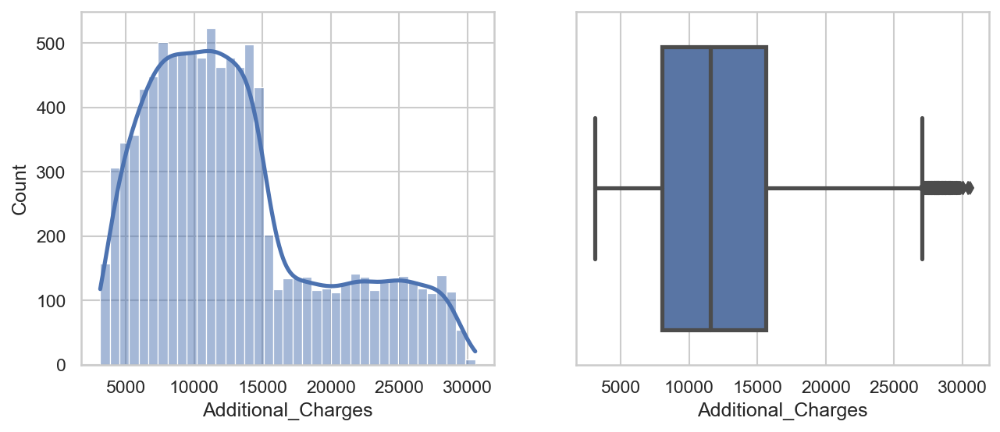

In [766]:
display(df[["Additional_Charges"]].describe())

display(
    pd.DataFrame(
        {
            "Std. Deviation": df[["Additional_Charges"]].std().round(),
            "Variance": df[["Additional_Charges"]].var().round(),
            "Range": df["Additional_Charges"].max() - df["Additional_Charges"].min(),
        }
    )
)

fig, axs = plt.subplots(ncols=2, figsize=(10, 4))
_ = sns.histplot(data=df, x="Additional_Charges", ax=axs[0], kde=True)
_ = sns.boxplot(data=df, x="Additional_Charges", ax=axs[1])
plt.show()


#### Predictor Variables
> The initial model includes nearly 40 data features, so we'll look at a few summary statistics and observations from these features. Each continuous or discrete value feature (Income, Population, Total Charges, Initial Days, Age) had significant standard deviations and variance compared to the categorical data features. All 10,000 records had a non-null value for each of these predictor variables. 

> Each variable's distribution shape is also worth mentioning. Age was the only variable with a uniform distribution. Children, Marital_Separated, Vitd_Supp, Population and Initial_Admin_Emergency_Admission each have a positively skewed distribution. Income and Vitd_Levels both have a normal distribution. Lastly, Initial_Days and TotalCharge had multimodal distributions. Most of the categorical variables had positively skewed distributions. The two exceptions to this are Overweight_Yes, which had a negatively skewed distribution and Gender_Male, which had a mostly uniform distribution.

In [778]:
df.describe().T


,count,mean,std,min,25%,50%,75%,max
Additional_Charges,10000.00,12934.53,6542.60,3125.70,7986.49,11573.98,15626.49,30566.07
Age,10000.00,53.51,20.64,18.00,36.00,53.00,71.00,89.00
Allergic_Rhinitis_Yes,10000.00,0.39,0.49,0.00,0.00,0.00,1.00,1.00
Anxiety_Yes,10000.00,0.32,0.47,0.00,0.00,0.00,1.00,1.00
Area_Suburban,10000.00,0.33,0.47,0.00,0.00,0.00,1.00,1.00
Area_Urban,10000.00,0.33,0.47,0.00,0.00,0.00,1.00,1.00
Arthritis_Yes,10000.00,0.36,0.48,0.00,0.00,0.00,1.00,1.00
Asthma_Yes,10000.00,0.29,0.45,0.00,0.00,0.00,1.00,1.00
BackPain_Yes,10000.00,0.41,0.49,0.00,0.00,0.00,1.00,1.00
Children,10000.00,2.10,2.16,0.00,0.00,1.00,3.00,10.00


In [774]:
pd.DataFrame(
    {"Range": df.max() - df.min(), "Variance": df.var(), "Std. Dev.": df.std()}
).sort_values(by="Std. Dev.", ascending=False)


,Range,Variance,Std. Dev.
Income,207095.02,813456185.17,28521.15
Population,122814.00,219773467.97,14824.76
Additional_Charges,27440.37,42805634.96,6542.60
TotalCharge,7242.42,4754117.29,2180.39
Initial_Days,70.98,692.18,26.31
Age,71.00,425.95,20.64
Children,10.00,4.68,2.16
Vitd_Levels,16.59,4.07,2.02
Doc_Visits,8.00,1.09,1.05
Full_Meals_Eaten,7.00,1.02,1.01


### 3.  Explain the steps used to prepare the data for the analysis, including the annotated code.
*The submission explains all necessary steps used to prepare the data for the analysis. The steps include the annotated code and relate to preparing for a multiple regression analysis.*



##### Drop Irrelevant Columns
> To remove unneeded data features such as geographic information, survey responses, metadata, and IDs, we'll first create a list of data features that seem potentially relevant to the target variable. Then we'll subset the original data frame on that feature list. 

##### Drop/Impute Missing Values
> We'll use pandas' isNull() function to determine which features — if any — have missing values. If we find these values we'll use the pandas.DataFrame.mean method to impute the missing values with that feature's mean value. We'll also use pandas.DataFrame.isna.sum to determine if certain features are missing a significant percentage of values. If we find these features, we'll use pandas.DataFrame.drop to remove the features.

##### Convert Object to Categorical Datatype
> We'll use pandas.DataFrame.select_dtypes to select all nominal data features and then we'll use pandas.DataFrame.astype to convert these features into category data types

##### Convert categorical variables into dummy/indicator variables
> We'll use pandas.get_dummies to convert categorical data features into one-hot encoded indicator variables.


### 4.  Generate univariate and bivariate visualizations of the distributions of variables in the cleaned data set. Include the target variable in your bivariate visualizations.
*The submission accurately generates both univariate and bivariate visualizations of the distributions of variables in the cleaned data set. The bivariate visualizations include the target variable.*


#### Univariate Visualizations

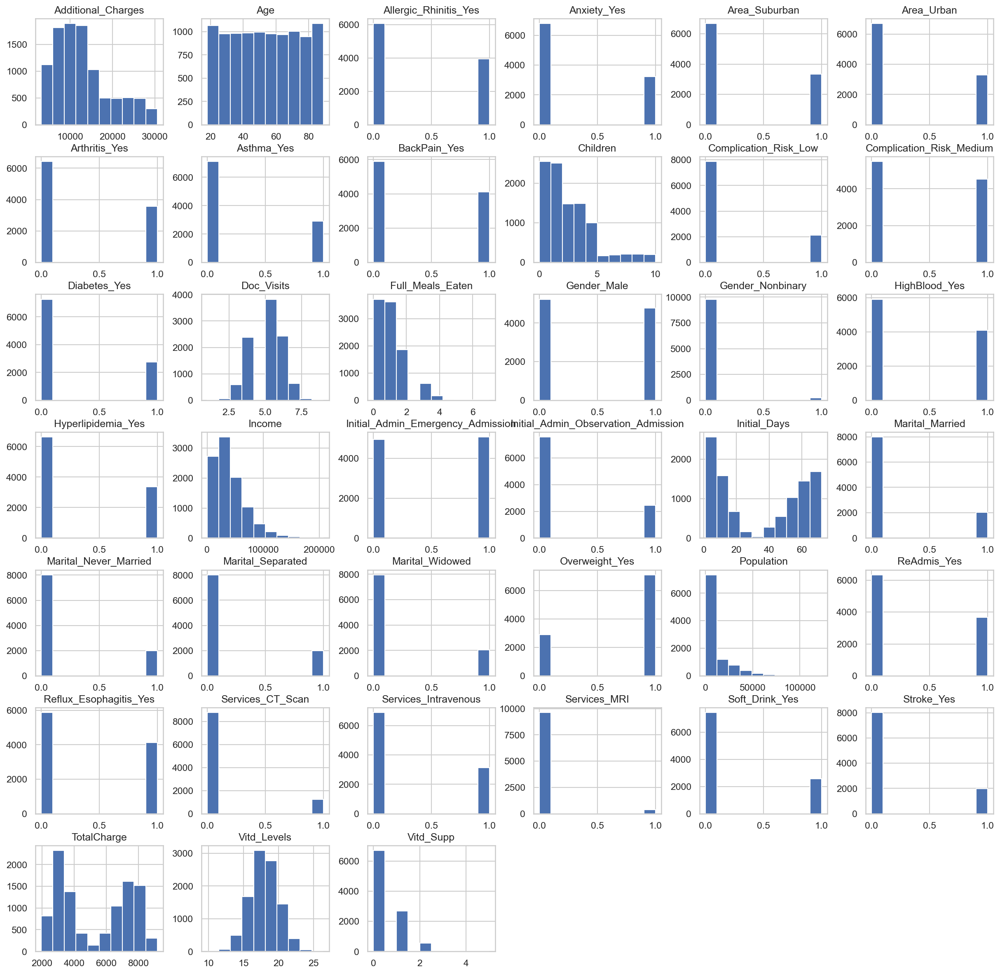

In [776]:
_ = df.hist(figsize=(20, 20))


In [777]:
fig, axs = plt.subplots(nrows=len(df.columns), ncols=2, figsize=(30, 175))

for i, col in enumerate(df.columns):
    _ = sns.kdeplot(data=df.round(), x=col, shade=True, ax=axs[i, 0])
    _ = sns.boxplot(data=df, x=col, ax=axs[i, 1])


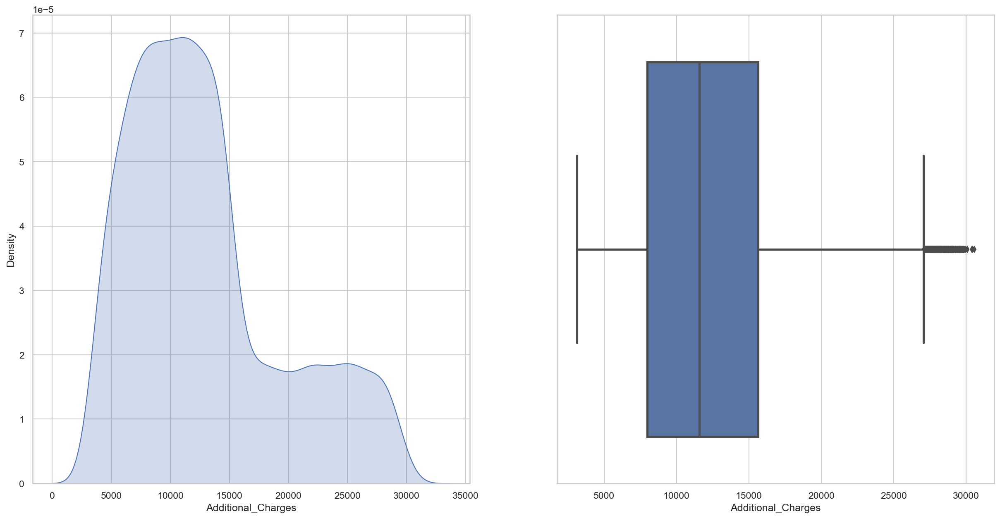

In [779]:
fig, axs = plt.subplots(ncols=2, figsize=(20, 10))

_ = sns.kdeplot(data=df, x="Additional_Charges", ax=axs[0], fill=True)
_ = sns.boxplot(data=df, x="Additional_Charges", ax=axs[1])


#### Bivariate Visualizations

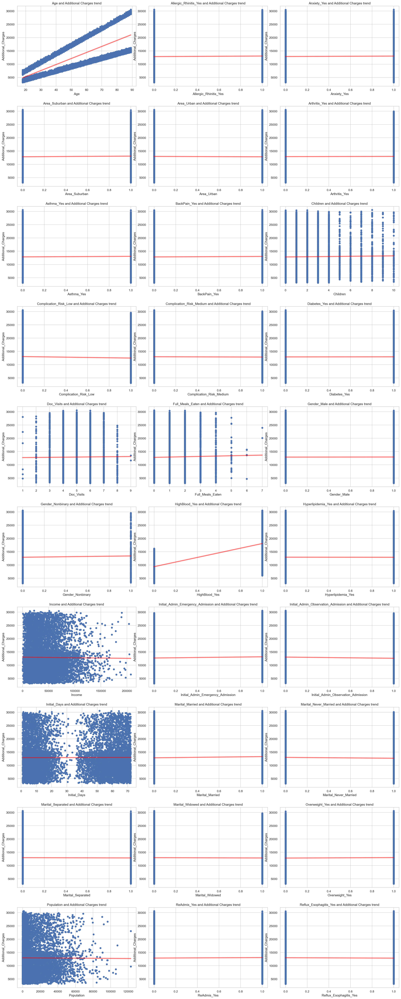

In [798]:
fig, axs = plt.subplots(nrows=10, ncols=3, figsize=(20, 50))
fig.tight_layout()

x_cols = df.columns[~df.columns.isin(["Additional_Charges"])]

plt.subplots_adjust(hspace=0.25)

for col, ax in zip(x_cols, [p for ax in axs for p in ax]):

    _ = sns.scatterplot(x=col, y="Additional_Charges", data=df, ax=ax)

    # trendline
    _ = sns.regplot(
        x=col,
        y="Additional_Charges",
        data=df,
        ci=None,
        ax=ax,
        line_kws={"alpha": 0.5, "color": "red"},
    )

    ax.title.set_text(f"{col} and Additional Charges trend")


Text(0.5, 1.0, 'Age and Additional Charges x High Blood Pressure')

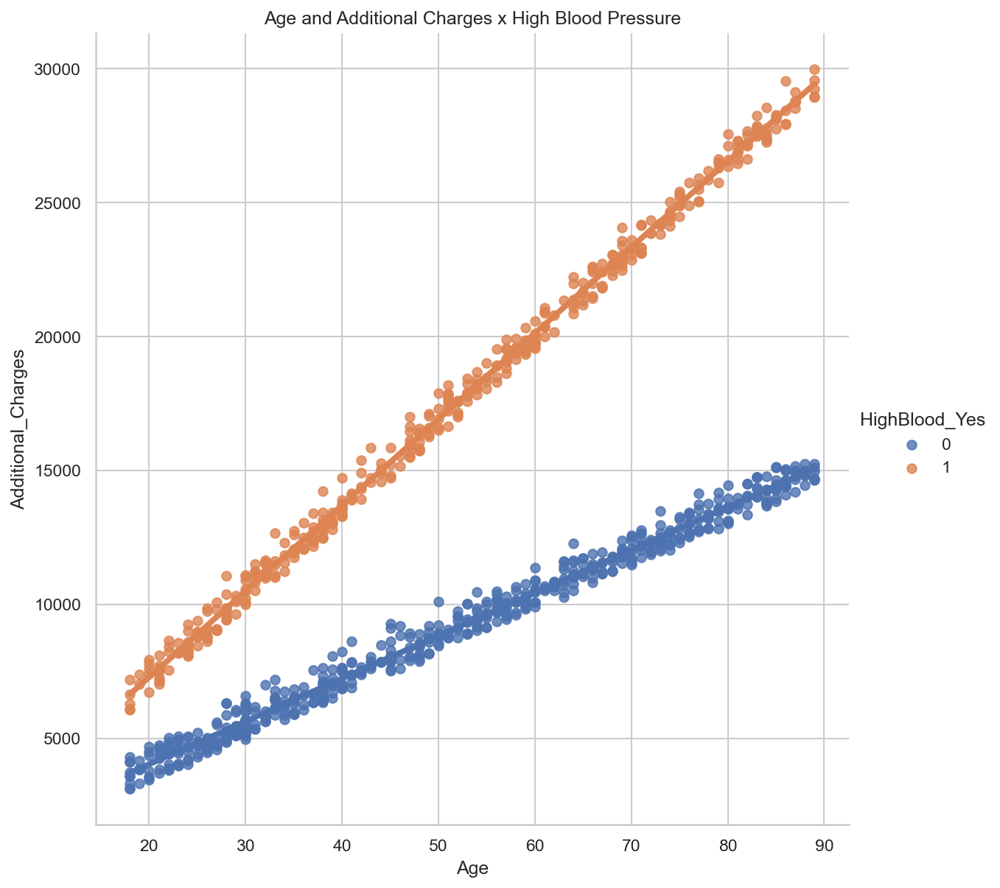

In [803]:
fig = sns.lmplot(
    x="Age", y="Additional_Charges", hue="HighBlood_Yes", data=df.sample(1000), height=8
)

plt.title("Age and Additional Charges x High Blood Pressure")


In [804]:
def create_heatmap(data, title="DataFrame Correlation Heatmap"):
    plt.figure(figsize=(50, 40))

    mask = np.triu(np.ones_like(data.corr(), dtype=bool))

    heatmap = sns.heatmap(
        data.corr(),
        mask=mask,
        vmin=-1,
        vmax=1,
        annot=True,
        annot_kws={"fontsize": 24},
        fmt=".2f",
    )
    heatmap.set_xticklabels(heatmap.get_xmajorticklabels(), fontsize=48)
    heatmap.set_yticklabels(heatmap.get_ymajorticklabels(), fontsize=48)
    heatmap.set_title(title, fontdict={"fontsize": 75}, pad=2)


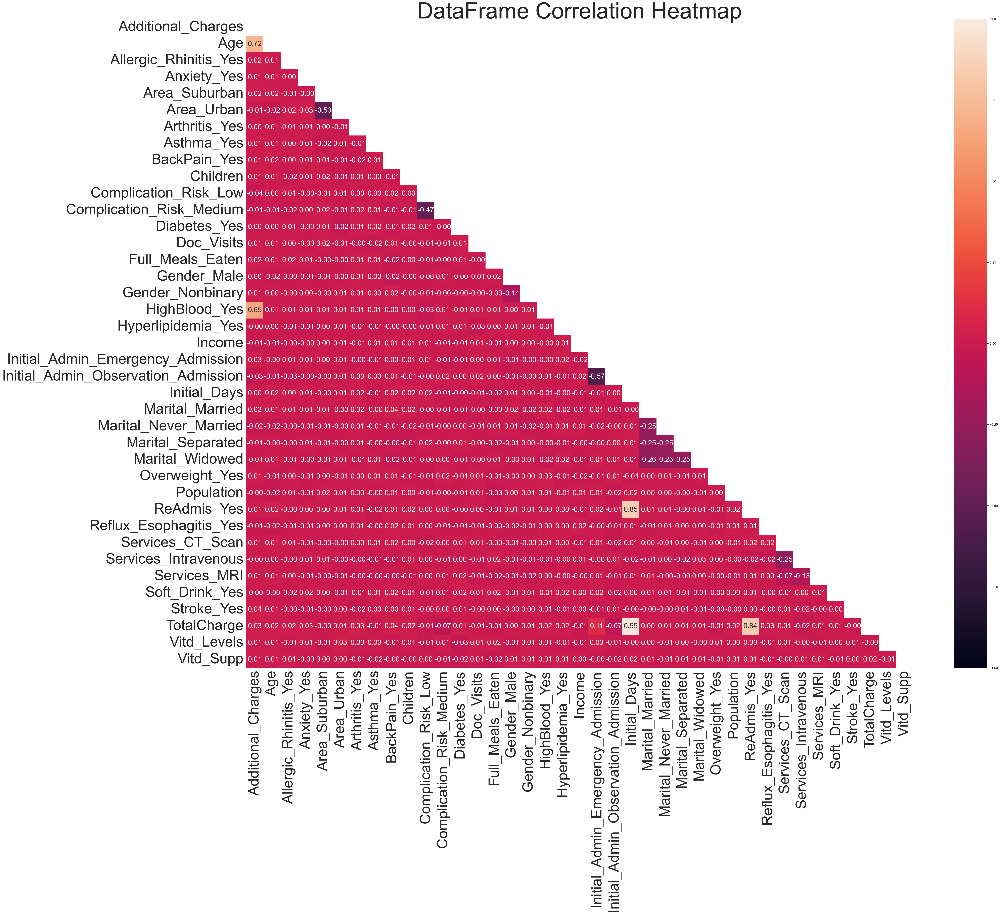

In [805]:
create_heatmap(df)


### 5.  Provide a copy of the prepared data set.
*The submission provides a copy of the fully prepared data set.*



In [806]:
df.to_csv("./src/medical_prepared_regression.csv")


# Part IV: Model Comparison and Analysis
---

## D.  Compare an initial and a reduced multiple regression model by doing the following:



### 1.  Construct an initial multiple regression model from all predictors that were identified in Part C2.
*The submission provides an accurate initial multiple regression model from all predictors identified in Part C2.*


In [807]:
def print_OLS_results(model):
    rnd = lambda v: v.round(3)

    print("AIC", rnd(model.aic))
    print("R-Squared", rnd(model.rsquared))
    print("R-Squared Adjusted", rnd(model.rsquared_adj))
    print("Mean-Squared Error:", rnd(model.mse_resid))
    print("Residual Standard Error:", rnd(np.sqrt(model.mse_resid)), end="\n\n")
    print(model.summary())


def get_OLS_summary(data, x_columns, y_column, output=True, qq_output=True):
    x = data[x_columns]
    y = data[y_column]
    x = sm.add_constant(x)
    results = sm.OLS(y, x).fit()

    if qq_output:
        _ = qqplot(data=results.resid, fit=True, line="45")

    if output:
        print_OLS_results(results)

    return results, x


def explanatory_vars(data, target_var):
    return data.columns[~data.columns.isin([target_var])]


#### Model With All Relevant Data Features
```
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     Additional_Charges   R-squared:                       0.939
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     4016.
Date:                Wed, 04 May 2022   Prob (F-statistic):               0.00
Time:                        21:11:00   Log-Likelihood:                -88087.
No. Observations:               10000   AIC:                         1.763e+05
Df Residuals:                    9961   BIC:                         1.765e+05
Df Model:                          38                                         
Covariance Type:            nonrobust    
```

AIC 176252.582
R-Squared 0.939
R-Squared Adjusted 0.938
Mean-Squared Error: 2632616.403
Residual Standard Error: 1622.534

                            OLS Regression Results                            
Dep. Variable:     Additional_Charges   R-squared:                       0.939
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     4016.
Date:                Sun, 15 May 2022   Prob (F-statistic):               0.00
Time:                        21:10:48   Log-Likelihood:                -88087.
No. Observations:               10000   AIC:                         1.763e+05
Df Residuals:                    9961   BIC:                         1.765e+05
Df Model:                          38                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0

,const,Age,Allergic_Rhinitis_Yes,Anxiety_Yes,Area_Suburban,Area_Urban,Arthritis_Yes,Asthma_Yes,BackPain_Yes,Children,Complication_Risk_Low,Complication_Risk_Medium,Diabetes_Yes,Doc_Visits,Full_Meals_Eaten,Gender_Male,Gender_Nonbinary,HighBlood_Yes,Hyperlipidemia_Yes,Income,Initial_Admin_Emergency_Admission,Initial_Admin_Observation_Admission,Initial_Days,Marital_Married,Marital_Never_Married,Marital_Separated,Marital_Widowed,Overweight_Yes,Population,ReAdmis_Yes,Reflux_Esophagitis_Yes,Services_CT_Scan,Services_Intravenous,Services_MRI,Soft_Drink_Yes,Stroke_Yes,TotalCharge,Vitd_Levels,Vitd_Supp
0,1.00,53,1,1,1,0,1,1,1,1,0,1,1,6,0,1,0,1,0,86575.93,1,0,10.59,0,0,0,0,0,2951,0,0,0,0,0,0,0,3726.70,19.14,0
1,1.00,51,0,0,0,1,0,0,0,3,0,0,0,4,2,0,0,1,0,46805.99,1,0,15.13,1,0,0,0,1,11303,0,1,0,1,0,0,0,4193.19,18.94,1
2,1.00,53,0,0,1,0,0,0,0,3,0,1,1,4,1,0,0,1,0,14370.14,0,0,4.77,0,0,0,1,1,17125,0,0,0,0,0,0,0,2434.23,18.06,0
3,1.00,78,0,0,1,0,1,1,0,0,0,1,0,4,1,1,0,0,0,39741.49,0,0,1.71,1,0,0,0,0,2162,0,1,0,0,0,0,1,2127.83,16.58,0
4,1.00,22,1,0,0,0,0,0,0,1,1,0,0,5,0,0,0,0,1,1209.56,0,0,1.25,0,0,0,1,0,5287,0,0,1,0,0,1,0,2113.07,17.44,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1.00,25,0,1,0,1,0,0,0,2,0,1,0,4,2,1,0,1,0,45967.61,1,0,51.56,0,0,0,1,0,4762,0,1,0,1,0,0,0,6850.94,16.98,1
9996,1.00,87,0,0,0,1,1,1,0,4,0,1,1,5,0,1,0,1,0,14983.02,0,0,68.67,0,0,0,1,1,1251,1,0,1,0,0,0,0,7741.69,18.18,0
9997,1.00,45,1,1,0,0,0,0,0,3,0,0,0,4,2,0,0,1,0,65917.81,0,0,70.15,0,0,1,0,1,532,1,0,0,1,0,1,0,8276.48,17.13,0
9998,1.00,43,0,0,0,0,0,0,1,3,0,1,0,5,2,1,0,0,0,29702.32,1,0,63.36,0,0,0,0,1,271,1,0,0,0,0,0,0,7644.48,19.91,1


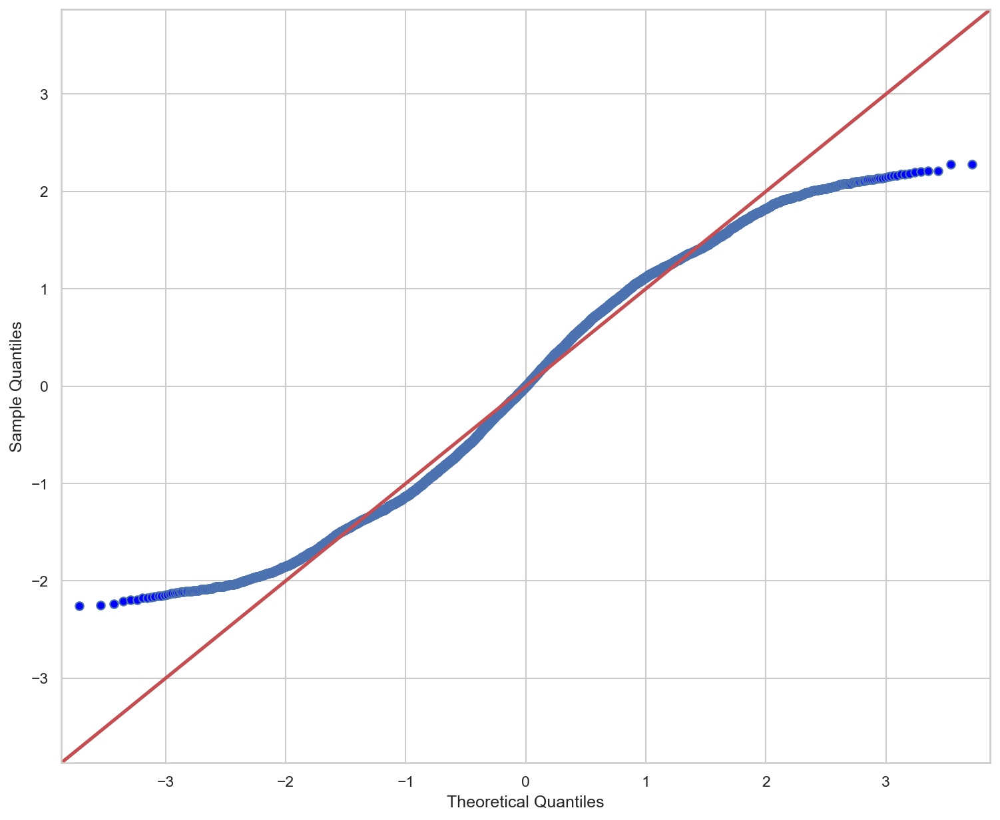

In [907]:
%%time
target_var = 'Additional_Charges'

all_relevant_x_columns = explanatory_vars(df, target_var)
all_model, all_model_x = get_OLS_summary(df, all_relevant_x_columns, target_var)
all_model_x

### 2.  Justify a statistically based variable selection procedure and a model evaluation metric to reduce the initial model in a way that aligns with the research question.
*The submission justifies a statistically based variable selection procedure and a model evaluation metric to reduce the initial model. The justification is in alignment with the research question.*



#### Variance Inflation Factor (VIF) / Multicollinearity
> Variance inflation factor (VIF) measures the amount of multicollinearity within multiple regression variables. Calculating the VIF for each explanatory variable and filtering out variables with a high VIF is a way to reduce variables. Like correlation, multicollinearity indicates a given variable is not necessary for the model because one or more other variables in the model already provide similar information. Our initial model summary indicated in the footnotes that there was strong multicollinearity present. Calculating VIF for our current variables indicates we can safely remove the TotalCharge and Initial_Days variables since their VIF values are well above 10.

```
                            OLS Regression Results                            
==============================================================================
Dep. Variable:     Additional_Charges   R-squared:                       0.939
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     4237.
Date:                Wed, 04 May 2022   Prob (F-statistic):               0.00
Time:                        21:26:49   Log-Likelihood:                -88091.
No. Observations:               10000   AIC:                         1.763e+05
Df Residuals:                    9963   BIC:                         1.765e+05
Df Model:                          36                                         
Covariance Type:            nonrobust    
```

In [813]:
def create_vif_dataframe(data):
    target_var = "Additional_Charges"
    x_columns = explanatory_vars(df, target_var)

    VIFS = {
        col: variance_inflation_factor(df[x_columns].values, i).round(3)
        for i, col in enumerate(x_columns)
    }

    VIF_df = pd.DataFrame({"Feature": VIFS.keys(), "VIF": VIFS.values()}).sort_values(
        by="VIF", ascending=False
    )
    VIF_df.style.hide_index()

    return VIF_df


def filter_high_VIF_features(VIF_data, VIF_threshold=5):
    low_collinearity_df = VIF_data[VIF_data.VIF < VIF_threshold]

    return low_collinearity_df.Feature.sort_values().values


def filter_high_VIF_features(data, VIF_threshold=5):
    low_collinearity_df = VIF_data[VIF_data.VIF < VIF_threshold]

    return low_collinearity_df.Feature.sort_values().values


In [811]:
vif_df = create_vif_dataframe(df)
vif_df


,Feature,VIF
35,TotalCharge,872.52
21,Initial_Days,357.91
19,Initial_Admin_Emergency_Admission,7.37
10,Complication_Risk_Medium,3.91
28,ReAdmis_Yes,3.65
18,Income,3.02
9,Complication_Risk_Low,2.36
16,HighBlood_Yes,1.89
7,BackPain_Yes,1.83
29,Reflux_Esophagitis_Yes,1.80


AIC 176394.274
R-Squared 0.938
R-Squared Adjusted 0.938
Mean-Squared Error: 2670982.175
Residual Standard Error: 1634.314

                            OLS Regression Results                            
Dep. Variable:     Additional_Charges   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                     4294.
Date:                Mon, 09 May 2022   Prob (F-statistic):               0.00
Time:                        18:54:41   Log-Likelihood:                -88161.
No. Observations:               10000   AIC:                         1.764e+05
Df Residuals:                    9964   BIC:                         1.767e+05
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0

(<statsmodels.regression.linear_model.RegressionResultsWrapper at 0x7f93c2358dc0>,
       const  Age  Allergic_Rhinitis_Yes  Anxiety_Yes  Area_Suburban  \
 0      1.00   53                      1            1              1   
 1      1.00   51                      0            0              0   
 2      1.00   53                      0            0              1   
 3      1.00   78                      0            0              1   
 4      1.00   22                      1            0              0   
 ...     ...  ...                    ...          ...            ...   
 9995   1.00   25                      0            1              0   
 9996   1.00   87                      0            0              0   
 9997   1.00   45                      1            1              0   
 9998   1.00   43                      0            0              0   
 9999   1.00   70                      1            0              0   
 
       Area_Urban  Arthritis_Yes  Asthma_Yes  BackP

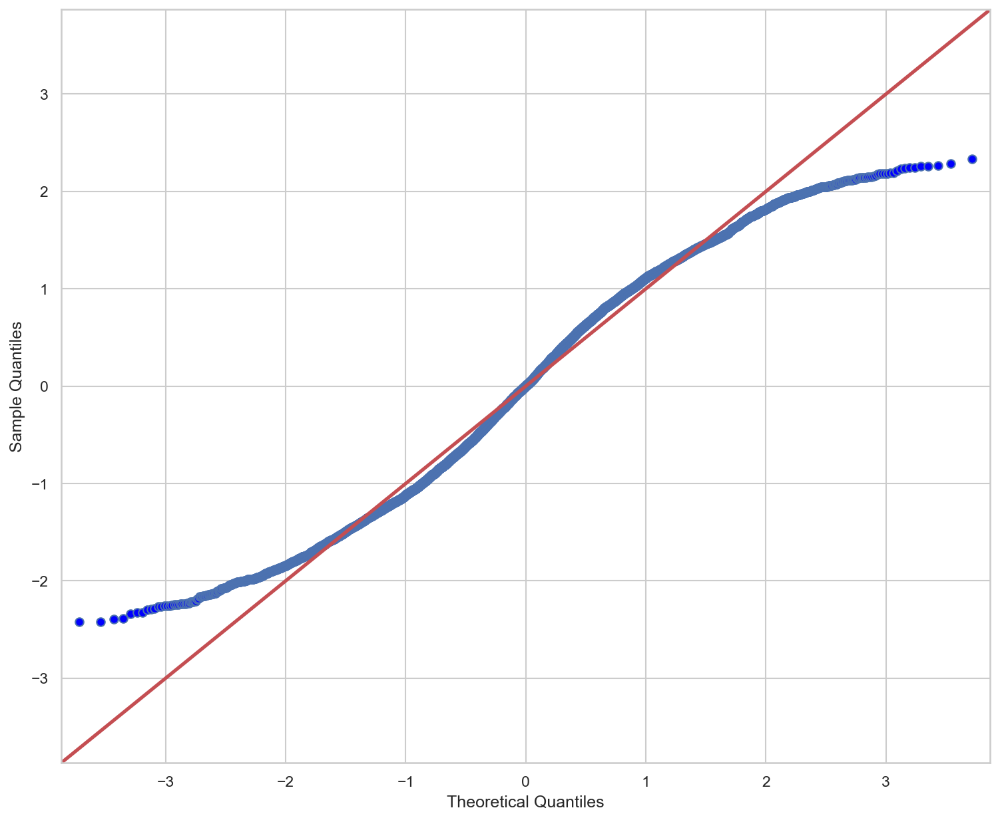

In [815]:
low_collinearity_x_cols = filter_high_VIF_features(vif_df, VIF_threshold=5)

low_collinearity_df = df[["Additional_Charges", *low_collinearity_x_cols]]

get_OLS_summary(low_collinearity_df, low_collinearity_x_cols, target_var)


#### [x] Akaike Information Criterion (AIC)

#### Recursive Feature Elimination (RFE)
> Recursive Feature Elimination (RFE) selects data features that are the most relevant in predicting the target variable (Brownlee, 2020). RFE is also useful because we can specify the number of features to retain and the selection criteria. Additionally, RFE will evaluate numerous combinations of variables with very little work required — writing code that could replicate this would be time-consuming and error-prone. Using this approach with a Ridge Regression estimator tells us we can start by narrowing down our variable count to 6 from 38.

In [816]:
def plot_feature_cross_val_scores(min_num_features, model):
    plt.plot(
        range(min_num_features, len(model.grid_scores_) + min_num_features),
        model.grid_scores_,
    )

    plt.xlabel("# Selected Features")
    plt.ylabel("Cross Validation Score (Accuracy)")
    plt.show()


#### Recursive Feature Elimination + Cross Validation (Ridge Regression Estimator)

'Selected Features'

['Age',
 'Complication_Risk_Low',
 'Complication_Risk_Medium',
 'Gender_Male',
 'HighBlood_Yes',
 'Initial_Admin_Emergency_Admission',
 'Services_MRI',
 'Stroke_Yes']

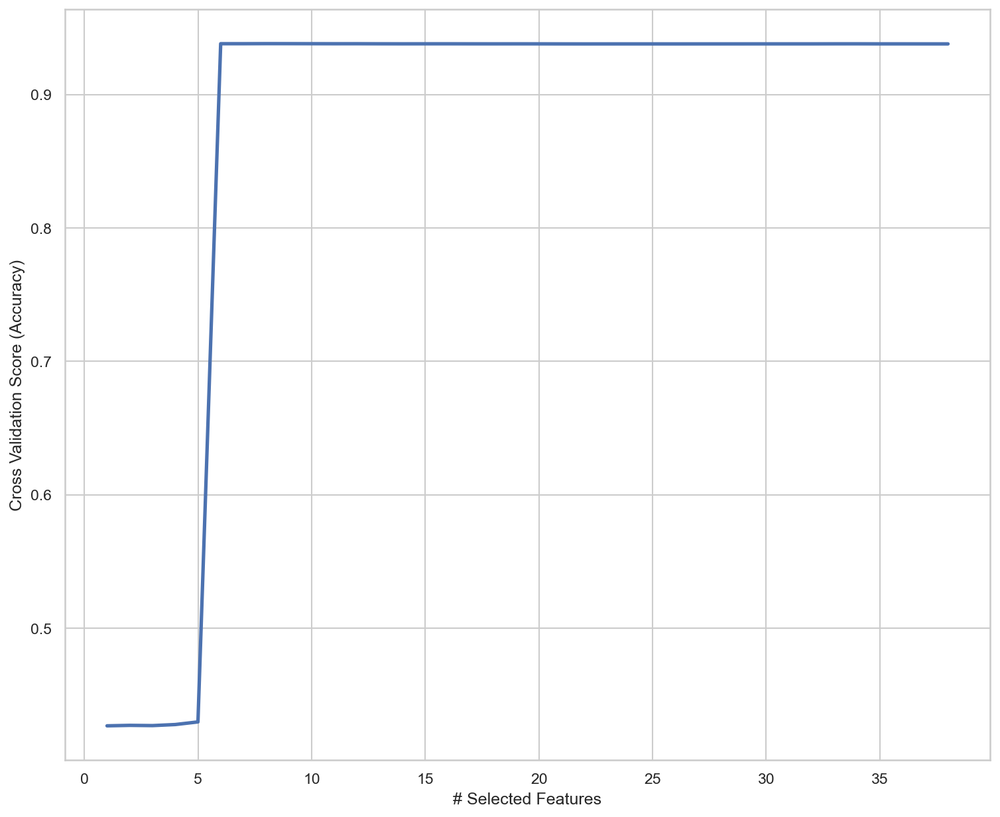

CPU times: user 10.2 s, sys: 3.09 s, total: 13.3 s
Wall time: 2.35 s


In [737]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
ridge = RidgeCV()
rfecv = RFECV(estimator=ridge, min_features_to_select=1, step=1).fit(X, y)

selected_features = rfecv.get_support()

display("Selected Features", list(X.columns[selected_features]))
plot_feature_cross_val_scores(min_num_features=1, model=rfecv)

#### Recursive Feature Elimination + Cross Validation (Linear Regression Estimator)

'Selected Features'

['Age',
 'Allergic_Rhinitis_Yes',
 'Anxiety_Yes',
 'Arthritis_Yes',
 'BackPain_Yes',
 'Complication_Risk_Low',
 'Complication_Risk_Medium',
 'Diabetes_Yes',
 'Gender_Male',
 'HighBlood_Yes',
 'Hyperlipidemia_Yes',
 'Initial_Admin_Emergency_Admission',
 'Initial_Admin_Observation_Admission',
 'Initial_Days',
 'ReAdmis_Yes',
 'Reflux_Esophagitis_Yes',
 'Services_MRI',
 'Stroke_Yes',
 'TotalCharge']

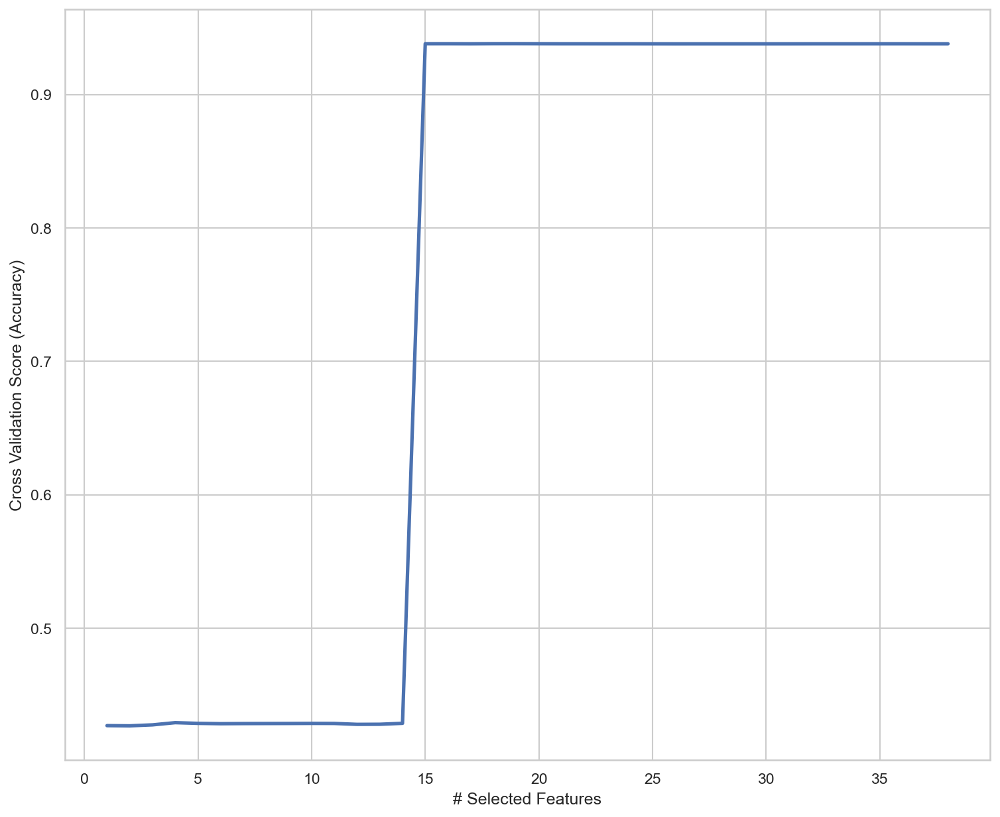

CPU times: user 6.17 s, sys: 1.87 s, total: 8.04 s
Wall time: 1.83 s


In [817]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
reg = LinearRegression()
rfecv = RFECV(estimator=reg, min_features_to_select=1, step=1).fit(X, y)

selected_features = rfecv.get_support()

display("Selected Features", list(X.columns[selected_features]))
plot_feature_cross_val_scores(min_num_features=1, model=rfecv)

#### Sequential Forward Selection (Ridge Regression)
> Like RFE, Sequential Forward Selection (SFS) is another method to iteratively select explanatory variables if there's evidence that the newly added variables improve the model. If the new variables add little to no value to the model, then the variable is removed from the list. Using this approach with a Ridge Regression estimator tells us we can start by narrowing down our variable count to 6 from 38.

In [818]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
ridge = RidgeCV().fit(X, y)

sfs = SequentialFeatureSelector(ridge, n_features_to_select=6, direction="forward").fit(X, y)

selected_features = sfs.get_support()

display("Selected Features", list(X.columns[selected_features]))

'Selected Features'

['Age',
 'Complication_Risk_Low',
 'Complication_Risk_Medium',
 'HighBlood_Yes',
 'Initial_Admin_Emergency_Admission',
 'Stroke_Yes']

CPU times: user 15.4 s, sys: 4.4 s, total: 19.8 s
Wall time: 4.46 s


#### Sequential Forward Selection (Linear Regression)

In [820]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
reg = LinearRegression().fit(X, y)

sfs = SequentialFeatureSelector(reg, n_features_to_select=15, direction="forward").fit(X, y)

selected_features = sfs.get_support()

display("Selected Features", list(X.columns[selected_features]))

'Selected Features'

['Age',
 'Arthritis_Yes',
 'Children',
 'Complication_Risk_Low',
 'Complication_Risk_Medium',
 'Diabetes_Yes',
 'Full_Meals_Eaten',
 'Gender_Male',
 'HighBlood_Yes',
 'Initial_Admin_Emergency_Admission',
 'Initial_Admin_Observation_Admission',
 'Services_Intravenous',
 'Services_MRI',
 'Stroke_Yes',
 'Vitd_Levels']

CPU times: user 29.4 s, sys: 8.65 s, total: 38 s
Wall time: 8.61 s


#### Sequential Forward Selection (ElasticNet)

In [821]:
%%time

X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
ridge = ElasticNet().fit(X, y)

sfs = SequentialFeatureSelector(ridge, n_features_to_select=6, direction="forward").fit(X, y)

selected_features = sfs.get_support()

display("Selected Features", list(X.columns[selected_features]))


'Selected Features'

['Age',
 'Complication_Risk_Low',
 'Complication_Risk_Medium',
 'HighBlood_Yes',
 'Initial_Admin_Emergency_Admission',
 'Stroke_Yes']

CPU times: user 9.56 s, sys: 2.29 s, total: 11.9 s
Wall time: 2.27 s


#### Lasso Linear Model Feature Importance
> Least Absolute Shrinkage and Selection Operator (LASSO) is a statistical formula for the regularization of data models and feature selection to avoid overfitting of the data (Great Learning Team, 2022). LASSO effectively shrinks the less important feature’s coefficient to zero, which removes the feature from the model (Stephanie & Statistics How To, 2020). LASSO recommended that we reduce our model to three explanatory variables.

Best alpha using LassoCV: 1833.1821811452169
Best score using LassoCV: 0.6118769445773667
Lasso selected 6 variables and eliminated 32 variables


,Feature,Feature Importance
0,Initial_Days,-118.03
35,TotalCharge,1.45
36,Age,222.69
37,HighBlood_Yes,886.84


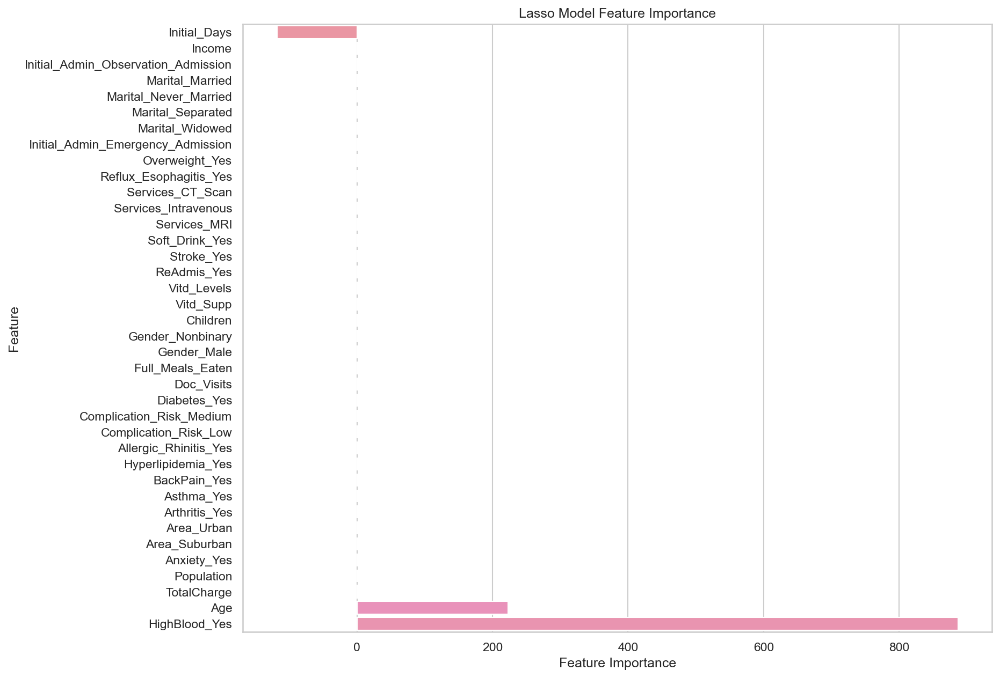

In [822]:
X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges

reg = LassoCV()
reg.fit(X, y)

print("Best alpha using LassoCV:", reg.alpha_)
# coefficient of determination of the prediction.
print("Best score using LassoCV:", reg.score(X, y))

# The amount of penalization chosen by cross validation.
coef = pd.Series(reg.coef_, index=X.columns)

num_selected_vars = sum(abs(coef) > 0)

print(
    f"Lasso selected {num_selected_vars} variables and eliminated { sum(abs(coef) == 0) } variables"
)

imp_coef = coef.sort_values()
imp_coef = pd.DataFrame(imp_coef, columns=["Feature Importance"])
imp_coef.reset_index(inplace=True)
imp_coef = imp_coef.rename(columns={"index": "Feature"})

barplot = sns.barplot(data=imp_coef, y="Feature", x="Feature Importance", orient="h")
barplot.set_title("Lasso Model Feature Importance")

imp_coef[abs(imp_coef["Feature Importance"]) > 1]


#### Sequential Backward Selection (Ridge Regression)

In [823]:
X, y = df[explanatory_vars(df, "Additional_Charges")], df.Additional_Charges
ridge = RidgeCV().fit(X, y)

sfs = SequentialFeatureSelector(
    ridge, n_features_to_select=6, direction="backward"
).fit(X, y)

selected_features = sfs.get_support()

display("Selected Features", list(X.columns[selected_features]))


'Selected Features'

['Age',
 'Complication_Risk_Low',
 'Complication_Risk_Medium',
 'HighBlood_Yes',
 'Initial_Admin_Emergency_Admission',
 'Stroke_Yes']

#### [X] Low P-Value
```
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:     Additional_Charges   R-squared (uncentered):                   0.987
Model:                            OLS   Adj. R-squared (uncentered):              0.987
Method:                 Least Squares   F-statistic:                          6.054e+04
Date:                Wed, 04 May 2022   Prob (F-statistic):                        0.00
Time:                        21:10:08   Log-Likelihood:                         -88107.
No. Observations:               10000   AIC:                                  1.762e+05
Df Residuals:                    9987   BIC:                                  1.763e+05
Df Model:                          13                                                  
Covariance Type:            nonrobust
```

'Low P-Value Cols'

['Age', 'Gender_Male', 'Stroke_Yes']

AIC 196875.754
R-Squared 0.515
R-Squared Adjusted 0.515
Mean-Squared Error: 20775779.922
Residual Standard Error: 4558.046

                            OLS Regression Results                            
Dep. Variable:     Additional_Charges   R-squared:                       0.515
Model:                            OLS   Adj. R-squared:                  0.515
Method:                 Least Squares   F-statistic:                     3535.
Date:                Mon, 09 May 2022   Prob (F-statistic):               0.00
Time:                        18:58:18   Log-Likelihood:                -98434.
No. Observations:               10000   AIC:                         1.969e+05
Df Residuals:                    9996   BIC:                         1.969e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
------

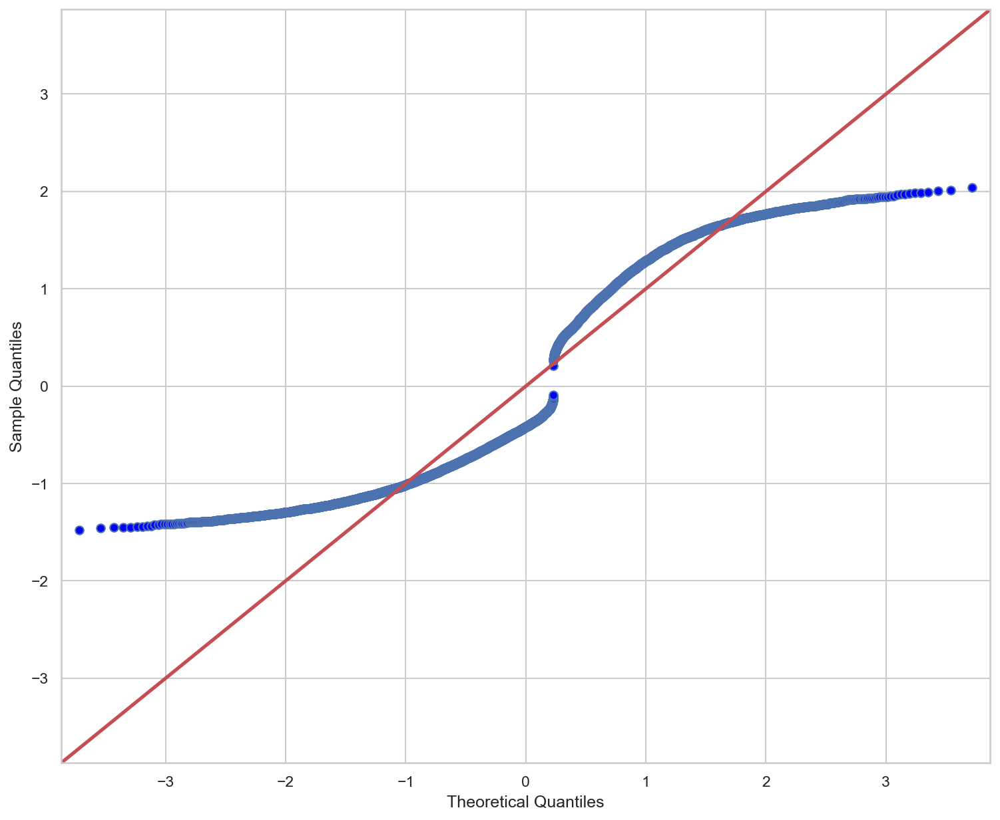

In [824]:
low_p_val_columns = all_model.pvalues[all_model.pvalues < 0.05].to_dict().keys()

display("Low P-Value Cols", list(low_p_val_columns))
low_p_val_model = get_OLS_summary(df, low_p_val_columns, target_var)


### 3.  Provide a reduced multiple regression model that includes both categorical and continuous variables. (Note: The output should include a screenshot of each model.)
*The submission provides a reduced multiple regression model that includes both categorical and continuous variables, and the reduced model is in alignment with the justification from part D2.*



#### Train/Test Split


******************** TRAINING DATA ********************
AIC 118216.814
R-Squared 0.937
R-Squared Adjusted 0.937
Mean-Squared Error: 2691683.771
Residual Standard Error: 1640.635

                            OLS Regression Results                            
Dep. Variable:     Additional_Charges   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                 2.494e+04
Date:                Tue, 10 May 2022   Prob (F-statistic):               0.00
Time:                        08:21:54   Log-Likelihood:                -59103.
No. Observations:                6700   AIC:                         1.182e+05
Df Residuals:                    6695   BIC:                         1.183e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                              

(<statsmodels.regression.linear_model.RegressionResultsWrapper at 0x7f94c2be4d30>,
       const  Age  HighBlood_Yes  Initial_Admin_Emergency_Admission  Stroke_Yes
 9953   1.00   89              0                                  0           0
 3850   1.00   58              0                                  1           0
 4962   1.00   79              1                                  0           0
 3886   1.00   48              0                                  1           0
 5437   1.00   49              0                                  0           0
 ...     ...  ...            ...                                ...         ...
 2195   1.00   65              0                                  1           1
 4095   1.00   56              1                                  1           0
 543    1.00   41              1                                  0           1
 2704   1.00   48              0                                  0           0
 1586   1.00   24              1     

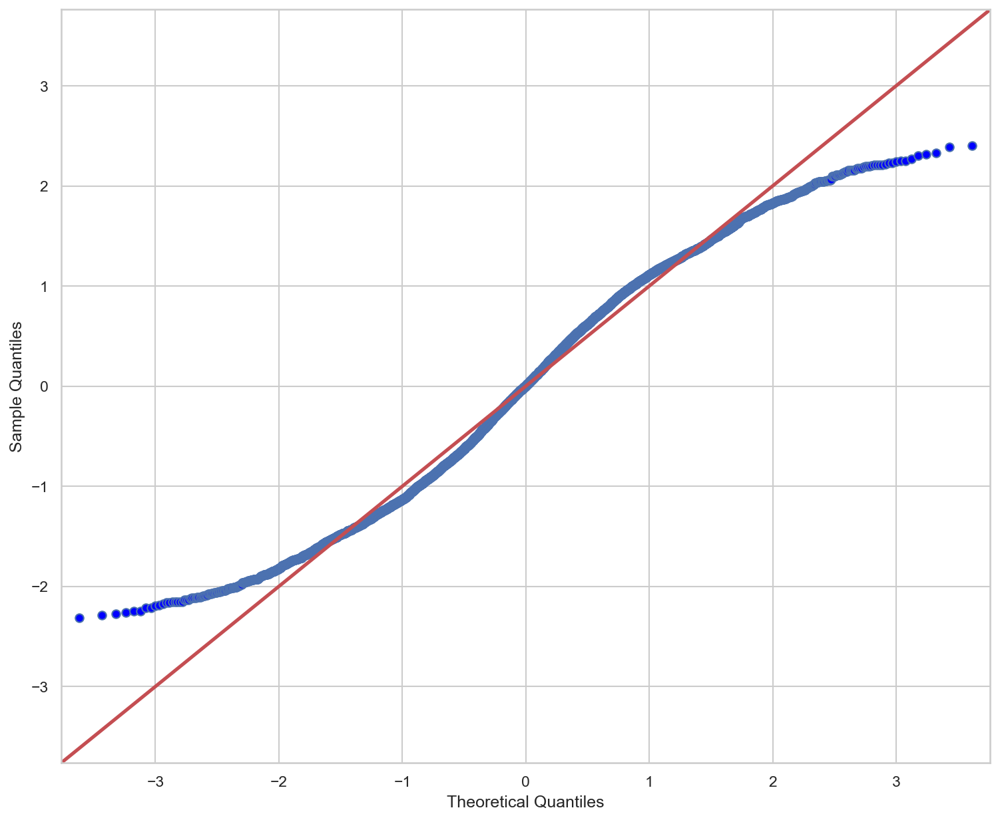

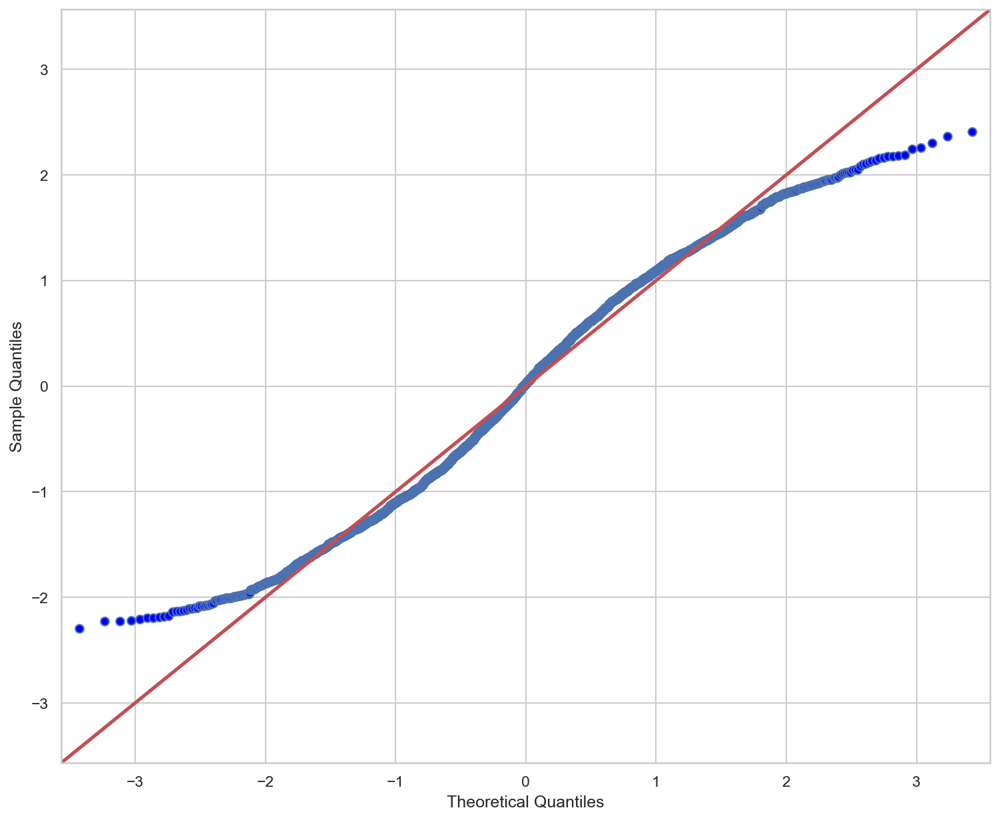

In [906]:
target_var = 'Additional_Charges'

final_x_columns = ['Age','HighBlood_Yes','Initial_Admin_Emergency_Admission','Stroke_Yes']

x_train, x_test, y_train, y_test = train_test_split(
    df[final_x_columns], df[[target_var]], test_size=0.33, random_state=1)

# print(x_train)

stars = "*" * 20

print(f"\n{stars} TRAINING DATA {stars}")
train_df = pd.DataFrame({**x_train, **y_train})
get_OLS_summary(train_df, final_x_columns, target_var)

print(f"\n{stars} TEST DATA {stars}")
test_df = pd.DataFrame({**x_test, **y_test})
get_OLS_summary(test_df, final_x_columns, target_var)

AIC 176407.204
R-Squared 0.937
R-Squared Adjusted 0.937
Mean-Squared Error: 2682724.536
Residual Standard Error: 1637.902

                            OLS Regression Results                            
Dep. Variable:     Additional_Charges   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                 3.739e+04
Date:                Mon, 09 May 2022   Prob (F-statistic):               0.00
Time:                        18:58:18   Log-Likelihood:                -88199.
No. Observations:               10000   AIC:                         1.764e+05
Df Residuals:                    9995   BIC:                         1.764e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.0

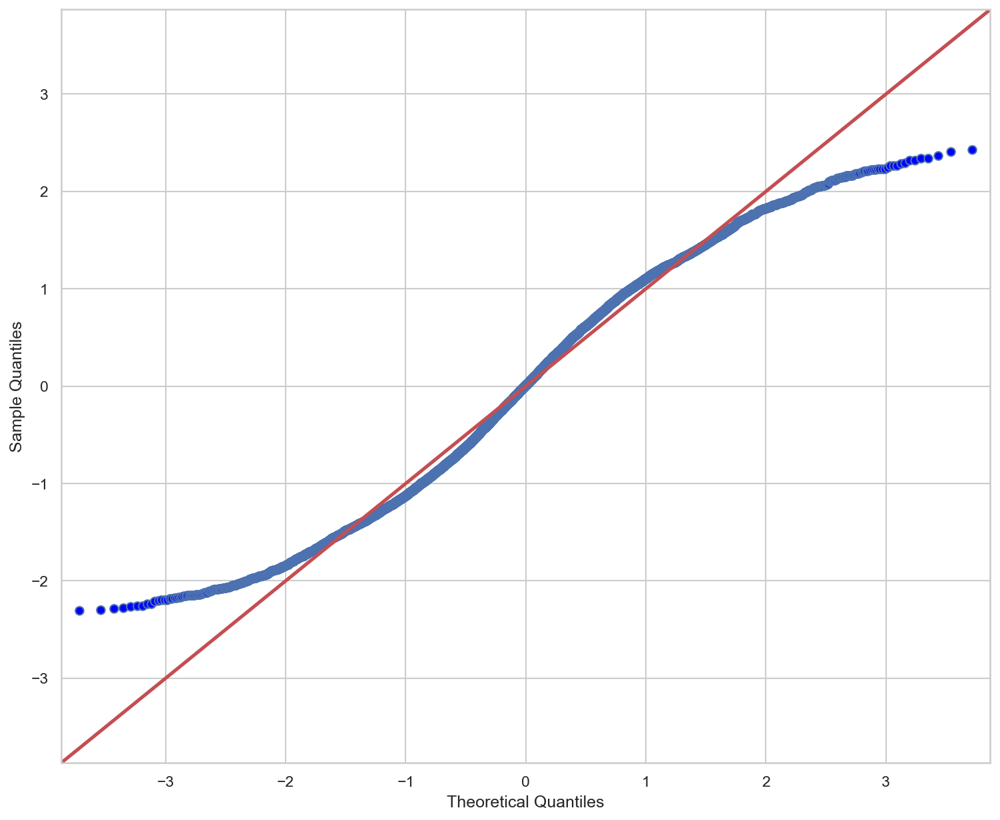

In [825]:
%%time
target_var = 'Additional_Charges'

final_x_columns = ['Age','HighBlood_Yes','Initial_Admin_Emergency_Admission','Stroke_Yes']

final_model, final_model_x = get_OLS_summary(df, final_x_columns, target_var)

## E.  Analyze the data set using your reduced multiple regression model by doing the following:



### 1.  Explain your data analysis process by comparing the initial and reduced multiple regression models, including the following elements:
*The submission accurately explains the data analysis process by comparing the initial and reduced multiple regression models, including all of the given elements.*

- the logic of the variable selection technique

- the model evaluation metric

- a residual plot

#### A. the logic of the variable selection technique
> The initial model didn't include any statistic-based variable selection techniques. Features were selected based on data that seemed related to the target variable. Additionally, many features that served as metadata were removed. The reduced model used multiple techniques to select four explanatory variables: Age, High Blood Pressure, Emergency Hospital Admission, and Stroke Incidence. VIF, RFE, SFS, Ridge Regression, and LASSO Regression were all referenced to validate that the selected four variables were appropriate. The reduced model calculated a high R-Squared value and low P-values for each coefficient, so all four explanatory variables were included in the final model.

#### B. the model evaluation metric

> The model evaluation metric for both the initial and reduced models was R-Squared and Adjusted R-Squared. These values measured how much of the data variance was explained by the model, as expressed in the spread of the residuals. The Adjusted R-Squared is simply R-Square adjusted for the number of explanatory variables in the model. The goal was to find values that were close to 1 and close to each other. The reduced model had an R-Squared and Adjusted R-Squared of 0.937 whereas the initial model had 0.939 and 0.938 respectively.

#### C. a residual plot

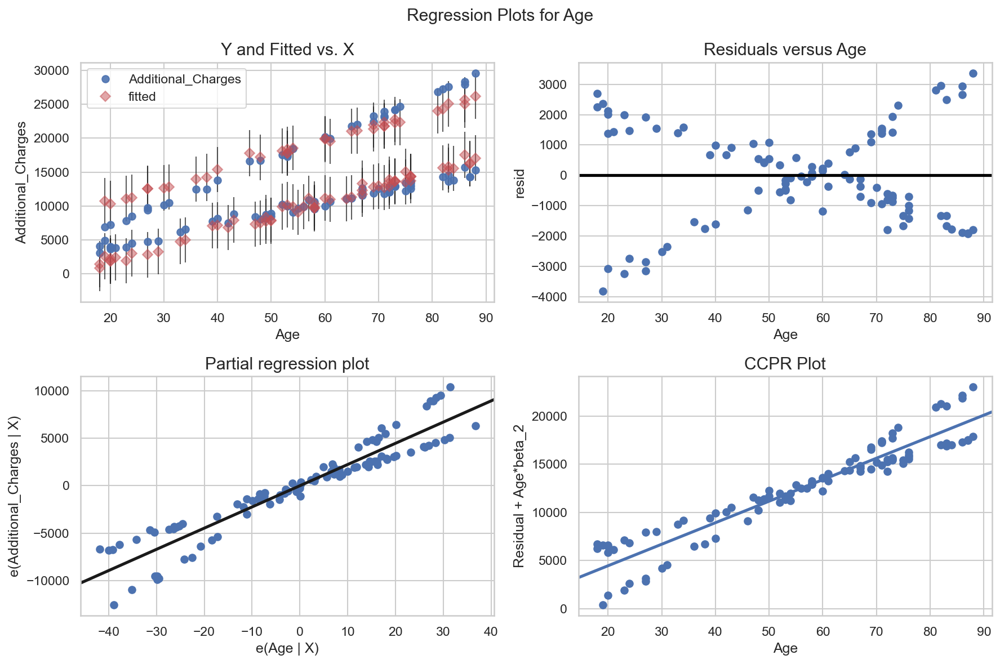

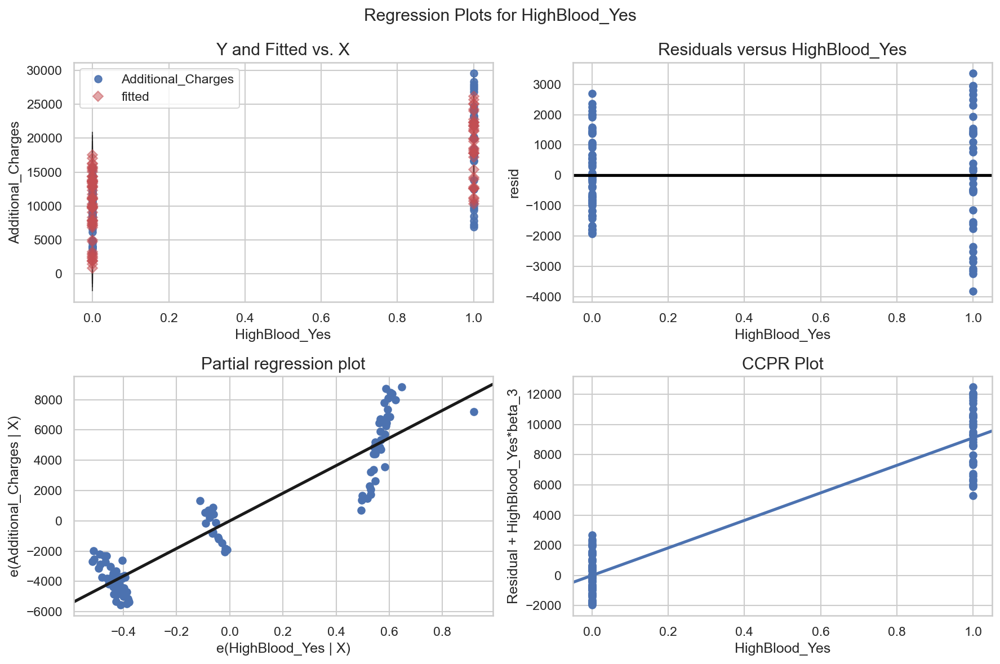

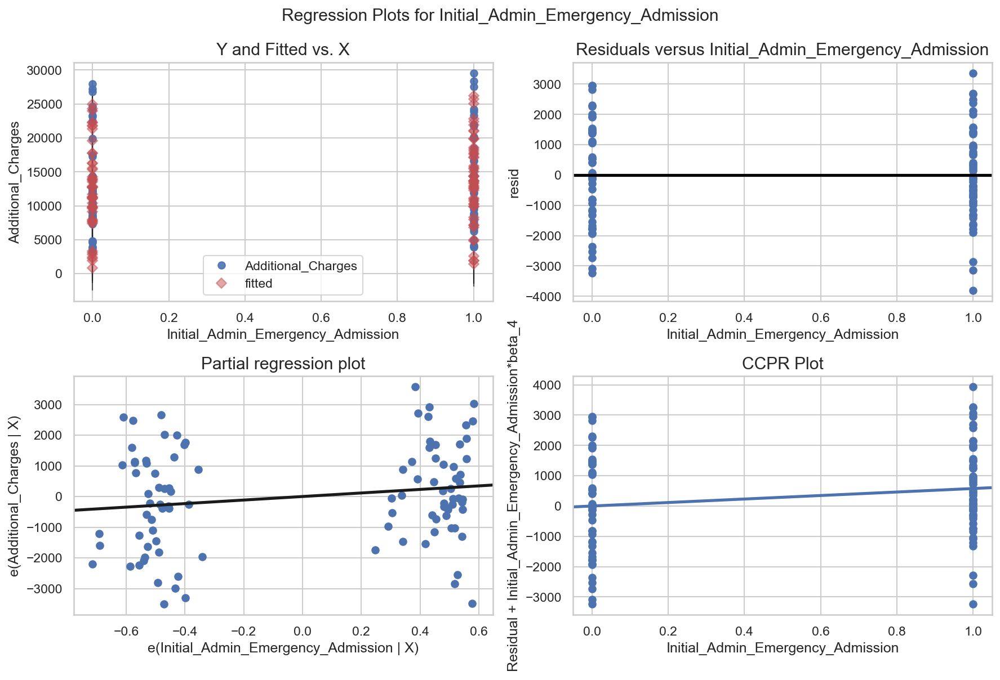

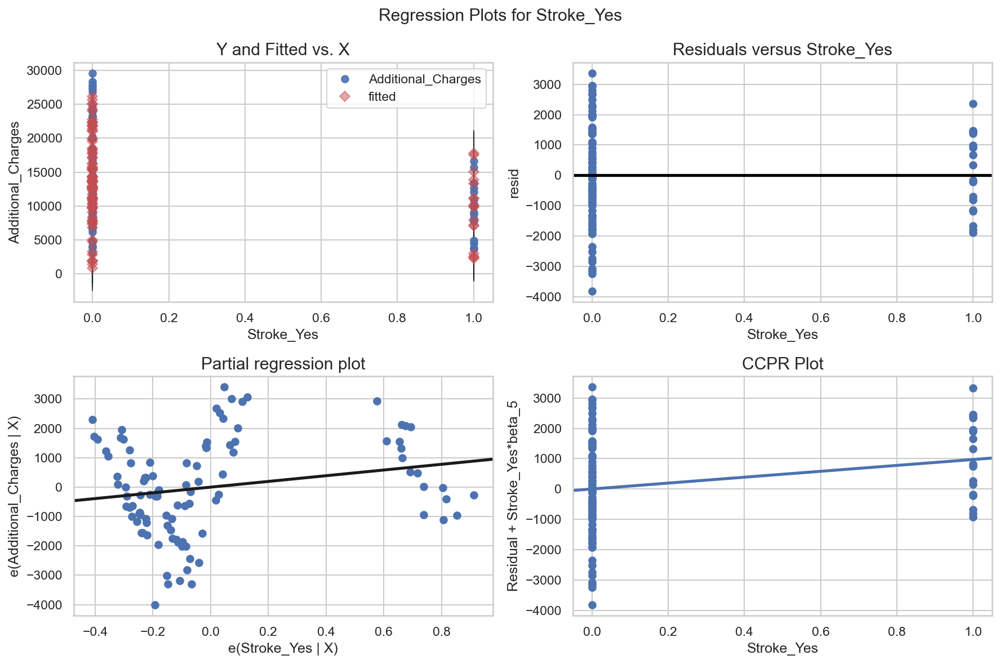

In [826]:
sample_df = df.sample(n=100, random_state=0)

# print(sample_df.head().T)
# print(list(original_df.columns))

reg_plot_model = ols(
    "Additional_Charges ~ Income + Age + HighBlood_Yes + Initial_Admin_Emergency_Admission + Stroke_Yes",
    data=sample_df,
).fit()

selected_features = list(final_model.params.keys()[1:])

for feature in selected_features:
    _ = sm.graphics.plot_regress_exog(
        reg_plot_model, feature, fig=plt.figure(figsize=(12, 8))
    )


### 2.  Provide the output and any calculations of the analysis you performed, including the model’s residual error. (Note: The output should include the predictions from the refined model you used to perform the analysis.)
*The submission provides the accurate output and calculations of the analysis performed, including the model’s residual error. The submissions includes all necessary output and calculations.*
<br />*Your model will be a mathematical formula that can be used to predict your dependent variable. The note is asking you to provide the output from that prediction. A sample output of 10 to 20 rows of data should be sufficient.*



#### Original Model Summary

In [827]:
# create a sample prediction to see what the initial model predicts
explanatory_sample_data = df.sample(n=1).to_dict(orient="records")

sample_obs = pd.DataFrame(
    [
        {
            "intercept": 1,
            "Age": 21,
            "Allergic_Rhinitis_Yes": 0,
            "Anxiety_Yes": 0,
            "Area_Suburban": 0,
            "Area_Urban": 1,
            "Arthritis_Yes": 0,
            "Asthma_Yes": 1,
            "BackPain_Yes": 1,
            "Children": 0,
            "Complication_Risk_Low": 0,
            "Complication_Risk_Medium": 0,
            "Diabetes_Yes": 0,
            "Doc_Visits": 5,
            "Full_Meals_Eaten": 1,
            "Gender_Male": 0,
            "Gender_Nonbinary": 0,
            "HighBlood_Yes": 1,
            "Hyperlipidemia_Yes": 0,
            "Income": 41027.79,
            "Initial_Admin_Emergency_Admission": 0,
            "Initial_Admin_Observation_Admission": 1,
            "Initial_Days": 2.238857388,
            "Marital_Married": 1,
            "Marital_Never_Married": 0,
            "Marital_Separated": 0,
            "Marital_Widowed": 0,
            "Overweight_Yes": 0,
            "Population": 50895,
            "ReAdmis_Yes": 0,
            "Reflux_Esophagitis_Yes": 1,
            "Services_CT_Scan": 0,
            "Services_Intravenous": 0,
            "Services_MRI": 0,
            "Soft_Drink_Yes": 1,
            "Stroke_Yes": 0,
            "TotalCharge": 2709.776623,
            "Vitd_Levels": 18.93928527,
            "Vitd_Supp": 1,
        }
    ]
)

all_model.predict(sample_obs)


0   10542.48
dtype: float64

#### Original Model Predictions

In [828]:
explanatory_sample_data = all_model_x.sample(n=15)

predicted_additional_charges = all_model.predict(explanatory_sample_data)
prediction_data = explanatory_sample_data.assign(
    PredictedAdditionalCharges=predicted_additional_charges
)
prediction_data.sort_values("PredictedAdditionalCharges", ascending=False).T


,5801,2966,3409,263,8152,7065,4447,7914,2855,4411,6126,4524,7694,2825,428
const,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
Age,73.00,62.00,56.00,48.00,79.00,72.00,68.00,22.00,23.00,56.00,52.00,52.00,49.00,41.00,38.00
Allergic_Rhinitis_Yes,1.00,0.00,0.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Anxiety_Yes,0.00,1.00,1.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.00,0.00,1.00
Area_Suburban,0.00,0.00,0.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00
Area_Urban,1.00,1.00,0.00,0.00,1.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00
Arthritis_Yes,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
Asthma_Yes,0.00,1.00,1.00,1.00,0.00,0.00,1.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00
BackPain_Yes,0.00,0.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,1.00,1.00,0.00,1.00,0.00,0.00
Children,3.00,0.00,1.00,4.00,0.00,2.00,4.00,10.00,2.00,3.00,3.00,1.00,6.00,0.00,1.00


#### Reduced Model Summary

In [829]:
print_OLS_results(final_model)


AIC 176407.204
R-Squared 0.937
R-Squared Adjusted 0.937
Mean-Squared Error: 2682724.536
Residual Standard Error: 1637.902

                            OLS Regression Results                            
Dep. Variable:     Additional_Charges   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                 3.739e+04
Date:                Mon, 09 May 2022   Prob (F-statistic):               0.00
Time:                        18:59:25   Log-Likelihood:                -88199.
No. Observations:               10000   AIC:                         1.764e+05
Df Residuals:                    9995   BIC:                         1.764e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.0

#### Reduced Model Predictions

In [830]:
explanatory_sample_data = final_model_x.sample(n=15)

predicted_additional_charges = final_model.predict(explanatory_sample_data)
prediction_data = explanatory_sample_data.assign(
    PredictedAdditionalCharges=predicted_additional_charges
)
prediction_data.sort_values("PredictedAdditionalCharges", ascending=False).T


,9913,6141,566,6365,378,2362,5728,8813,2322,3869,5603,9557,3629,2523,4555
const,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
Age,75.00,69.00,69.00,63.00,50.00,83.00,72.00,24.00,22.00,24.00,57.00,45.00,41.00,31.00,26.00
HighBlood_Yes,1.00,1.00,1.00,1.00,1.00,0.00,0.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00,0.00
Initial_Admin_Emergency_Admission,1.00,1.00,1.00,1.00,0.00,1.00,0.00,1.00,1.00,0.00,1.00,0.00,1.00,1.00,1.00
Stroke_Yes,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
PredictedAdditionalCharges,23071.48,21716.97,21716.97,20362.47,16915.50,16239.83,13244.36,11558.20,11106.69,11045.99,10731.24,7149.10,6758.30,4500.80,3372.04


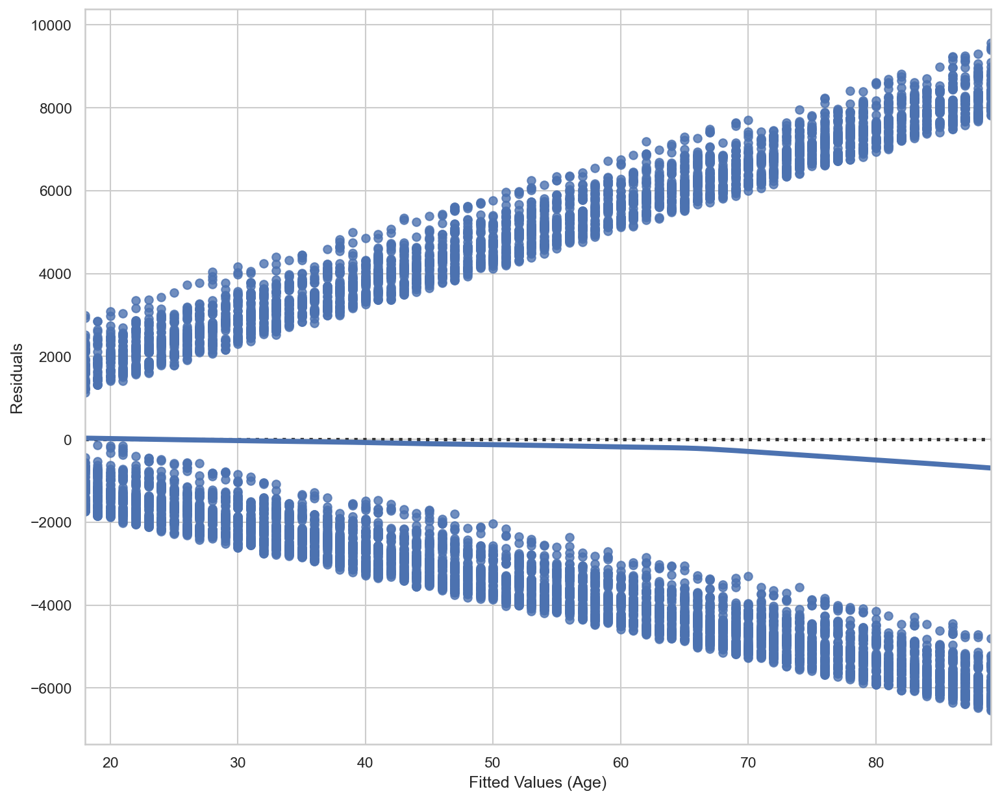

In [831]:
_ = sns.residplot(x="Age", y="Additional_Charges", data=df, lowess=True)

plt.xlabel("Fitted Values (Age)")
plt.ylabel("Residuals")

plt.show()


#### Residuals Q-Q Plot

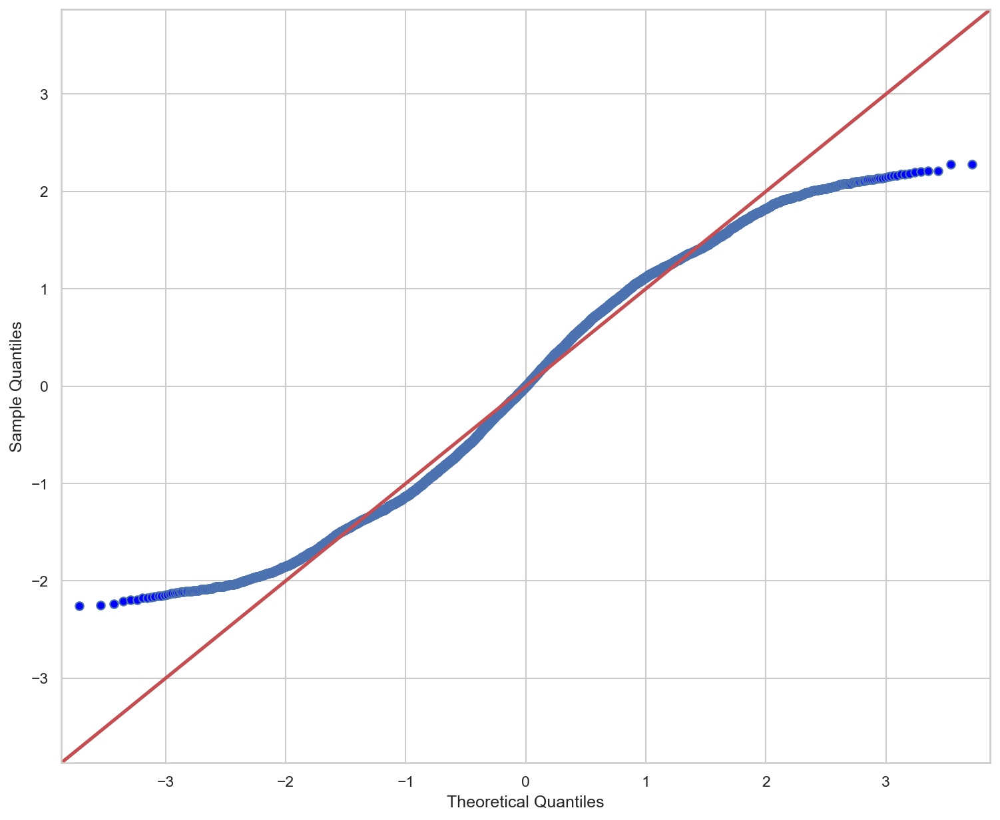

In [834]:
_ = qqplot(data=all_model.resid, fit=True, line="45")


### 3.  Provide the code used to support the implementation of the multiple regression models.
*The submission provides the code used to support the implementation of the multiple regression models, and the code is complete and accurate.*


# Part V: Data Summary and Implications
---


## F.  Summarize your findings and assumptions by doing the following:



### 1.  Discuss the results of your data analysis, including the following elements:
*The submission accurately discusses the results of the data analysis, and the discussion addresses all of the given elements and is in alignment with the research question and the data analysis.*
- a regression equation for the reduced model

- an interpretation of coefficients of the statistically significant variables of the model

- the statistical and practical significance of the model

- the limitations of the data analysis


#### Regression equation for the reduced model

Y = -3009.6806 + (225.7506 * Age) + (8637.6523 * HighBlood_Yes) + (512.2099 * Initial_Admin_Emergency_Admission) + (360.9263 * Stroke_Yes)

In [753]:
(
    intercept,
    Age,
    HighBlood_Yes,
    Initial_Admin_Emergency_Admission,
    Stroke_Yes,
) = final_model.params


def predict_additional_charges(
    Age, HighBlood_Yes, Initial_Admin_Emergency_Admission, Stroke_Yes
):
    intercept = -3009.6806
    B1 = 225.7506
    B2 = 8637.6523
    B3 = 512.2099
    B4 = 360.9263

    equation = (
        intercept
        + (B1 * Age)
        + (B2 * HighBlood_Yes)
        + (B3 * Initial_Admin_Emergency_Admission)
        + (B4 * Stroke_Yes)
    )
    y = round(equation, 2)

    return y


predict_additional_charges(
    Age=85, HighBlood_Yes=1, Initial_Admin_Emergency_Admission=1, Stroke_Yes=1
)


25689.91

#### Interpretation of coefficients of the statistically significant variables of the model
> To provide insight into our model's performance, we need to understand and communicate the model's summary and the respective coefficients.

> The R-squared values reflect how well the model fits the observed additional charges data. More specifically, it tells us the proportion of the variation in the target variable that is predicted using the explanatory variables. The R-squared values range from 0 to 1 — values closer to 1 indicate a better fit. Our value of 0.937 indicates our model closely approximates observed data.

> The model also provides multiple metrics for each explanatory variable. These metrics include the coefficient, standard error, t-value, and p-value.

> The standard error (std err) for each explanatory variable reflects the variable's calculated coefficient accuracy. A lower standard error indicates a more accurate coefficient. In our model, Age has the lowest standard error with a value of 0.794.

> The t-value (t) for each explanatory variable reflects the calculated test statistic using a two-sided t-test. A larger test statistic indicates that the observed results are less likely to have occurred by chance (Bevans, 2022).

> The p-value (P >|t|) for each explanatory variable reflects the probability of the calculated t-value occurring by chance if the null hypothesis were true (Bevans, 2022). Said another way, this value indicates the likelihood of the t-value if a patient's demographics and pre-existing health conditions did not influence a patient's additional medical charges. For reference, a p-value less than 0.05 is deemed statistically significant. Each of the 4 explanatory variables has a p-value well below this threshold. In this instance, the probability of a change in Additional_Charges due to a one-unit change in Age is 0%, under the assumption that the null hypothesis is true and that there isn't a relationship between additional charges and a patient's age (Dobbins et al., 2022).

> It's also worth exploring the coefficients (coeff) for each value. The first value is "const" which represents the Y-intercept in our regression equation. This value indicates that if all explanatory values were zero, Additional Charges would theoretically be -\\$3,009. Next, the model indicates that as age increases by a year, additional charges increase by \\$226.
The last 3 variables are categorical meaning that their contribution to the additional charges is either \\$0 or a static number defined in the coef column. For example, having high blood pressure increases additional charges by $8,637. Additionally, being initially admitted to the hospital for a medical emergency increases additional charges by \\$512. Lastly, previously having a stroke increases additional charges by \\$360.



In [835]:
print_OLS_results(final_model)


AIC 176407.204
R-Squared 0.937
R-Squared Adjusted 0.937
Mean-Squared Error: 2682724.536
Residual Standard Error: 1637.902

                            OLS Regression Results                            
Dep. Variable:     Additional_Charges   R-squared:                       0.937
Model:                            OLS   Adj. R-squared:                  0.937
Method:                 Least Squares   F-statistic:                 3.739e+04
Date:                Mon, 09 May 2022   Prob (F-statistic):               0.00
Time:                        19:01:53   Log-Likelihood:                -88199.
No. Observations:               10000   AIC:                         1.764e+05
Df Residuals:                    9995   BIC:                         1.764e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.0

#### Statistical and practical significance of the model
> Because the p-value is so low for the dependent variables and the R-Squared value (0.937) is close to 1, we can reject the null hypothesis and conclude that a patient's demographics and pre-existing health conditions likely influence their additional medical charges.

#### Limitations of the data analysis
> This model achieved a very high R-Squared value of 0.937, but that doesn't mean the model, or the analysis is without limitations. For example, the dataset lacks information on historical hospital visits, additional patient lifestyle data as well as patient health information — this information could better determine additional charges and provide more actionable insight for patients and insurers looking for ways to reduce additional charges. For example, it could be useful to know how often the patient visits their doctor, if they're a smoker, their diet or if they participate in other activities that may be detrimental to one's health. 

> The model also saw inconsistent variance in residuals for the Age explanatory variable. The residuals were minimal for patients between the ages of 40 to 70, but ages outside of this range sometimes saw residual values that were 2 to 3x larger. Likewise, cases where the model mistakenly over-estimates the additional costs are likely a pleasant surprise for patients, but instances, where the model underestimates the additional charges by several thousands of dollars will be less than acceptable for patients.

## 2.  Recommend a course of action based on your results.
*The submission recommends an appropriate course of action based on the results as they relate to the research question.*


> My recommended a course of action based on the reduced model results is to use the model on a trial basis and continue to evaluate how well future additional charges estimates reflect the model's predictions. Furthermore, the medical chain can begin to communicate more accurate cost estimates with both patients and health care providers. Lastly, age, emergency hospital admission, and a history of having a stroke are not controllable, but high blood pressure largely is. This model's findings provide data that the hospital chain might want to provide in a pamphlet or other literature to communicate to patients that higher blood pressure is a prominent contributor to additional health care costs.

# Part VI: Demonstration
---

## H.  List the web sources used to acquire data or segments of third-party code to support the application. Ensure the web sources are reliable.
*The submission lists all web sources used to acquire data or segments of third-party code, and the web sources are reliable.*



- https://realpython.com/linear-regression-in-python/
- https://machinelearningmastery.com/rfe-feature-selection-in-python/
- https://towardsdatascience.com/stepwise-regression-tutorial-in-python-ebf7c782c922
- https://www.geeksforgeeks.org/detecting-multicollinearity-with-vif-python/
- https://www.qualtrics.com/support/stats-iq/analyses/regression-guides/interpreting-residual-plots-improve-regression/
- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-multiple-linear-regression/
- https://seaborn.pydata.org/generated/seaborn.lmplot.html
- https://stackoverflow.com/questions/14940743/selecting-excluding-sets-of-columns-in-pandashttps://stackoverflow.com/questions/14940743/selecting-excluding-sets-of-columns-in-pandas
- https://stackoverflow.com/a/64189830
- https://moonbooks.org/Articles/How-to-increase-the-size-of-axes-labels-on-a-seaborn-heatmap-in-python-/
- https://scikit-learn.org/stable/auto_examples/feature_selection/plot_select_from_model_diabetes.html#sphx-glr-auto-examples-feature-selection-plot-select-from-model-diabetes-py
- https://scikit-learn.org/stable/auto_examples/feature_selection/plot_rfe_with_cross_validation.html#sphx-glr-auto-examples-feature-selection-plot-rfe-with-cross-validation-py
- https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html#sklearn.feature_selection.RFE
- https://www.statology.org/residual-plot-python/
- https://towardsdatascience.com/feature-selection-with-pandas-e3690ad8504b
- https://moonbooks.org/Articles/How-to-increase-the-size-of-axes-labels-on-a-seaborn-heatmap-in-python-/

## I.  Acknowledge sources, using in-text citations and references, for content that is quoted, paraphrased, or summarized.
*The submission includes in-text citations for sources that are properly quoted, paraphrased, or summarized and a reference list that accurately identifies the author, date, title, and source location as available.*



AskPython. (2020, October 13). 2 Easy Ways to Standardize Data in Python for Machine Learning. AskPython. Retrieved May 8, 2022, from https://www.askpython.com/python/examples/standardize-data-in-python 

Bevans, R. (2020, October 26). An introduction to multiple linear regression. Scribbr. Retrieved May 8, 2022, from https://www.scribbr.com/statistics/multiple-linear-regression/ 

Brownlee, J. (2020, August 27). Recursive Feature Elimination (RFE) for Feature Selection in Python. Machine Learning Mastery. Retrieved May 8, 2022, from https://machinelearningmastery.com/rfe-feature-selection-in-python/ 

Dobbins, T., Burke, J., & LearnDataSci. (2022). Predicting Housing Prices with Linear Regression using Python, pandas, and statsmodels. Learn Data Science - Tutorials, Books, Courses, and More. Retrieved May 8, 2022, from https://www.learndatasci.com/tutorials/predicting-housing-prices-linear-regression-using-python-pandas-statsmodels/ 

Great Learning Team. (2022, March 22). A Complete understanding of LASSO Regression. GreatLearning Blog: Free Resources what Matters to shape your Career! Retrieved May 8, 2022, from https://www.mygreatlearning.com/blog/understanding-of-lasso-regression/ 

Ingargiola, A., & contributors. (2015). What is the Jupyter Notebook. 1. What is the Jupyter Notebook? - Jupyter/IPython Notebook Quick Start Guide 0.1 documentation. Retrieved May 8, 2022, from https://jupyter-notebook-beginner-guide.readthedocs.io/en/latest/what_is_jupyter.html 

Pandas. Pandas Documentation - pandas 1.4.1 documentation. (2022). Retrieved February 10, 2022, from https://pandas.pydata.org/docs/index.html 

Perktold, J., Seabold, S., Taylor, J., & statsmodels-developers. (2018). Welcome to Statsmodels’s Documentation. StatsModels. Retrieved May 8, 2022, from https://www.statsmodels.org/v0.10.1/ 

scikit-learn developers. (2021). Getting started. Getting Started — scikit-learn 1.0.2 documentation. Retrieved May 8, 2022, from https://scikit-learn.org/stable/getting_started.html 

SciPy developers. (2022). Numpy and Scipy Documentation. Numpy and Scipy Documentation - Numpy and Scipy documentation. Retrieved May 8, 2022, from https://docs.scipy.org/doc/  

Stephanie, & Statistics How To. (2020, July 7). Regularization: Simple definition, L1 & L2 penalties. Statistics How To. Retrieved May 8, 2022, from https://www.statisticshowto.com/regularization/ 

Stojiljković, M. (2021, March 19). Linear Regression in Python. Real Python. Retrieved May 8, 2022, from https://realpython.com/linear-regression-in-python/ 


---
# Z. MISC.


******************** TRAINING DATA ********************
AIC 118160.163
R-Squared 0.938
R-Squared Adjusted 0.938
Mean-Squared Error: 2669020.576
Residual Standard Error: 1633.714

                            OLS Regression Results                            
Dep. Variable:     Additional_Charges   R-squared:                       0.938
Model:                            OLS   Adj. R-squared:                  0.938
Method:                 Least Squares   F-statistic:                 2.533e+04
Date:                Mon, 09 May 2022   Prob (F-statistic):               0.00
Time:                        19:36:17   Log-Likelihood:                -59075.
No. Observations:                6700   AIC:                         1.182e+05
Df Residuals:                    6695   BIC:                         1.182e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                              

(<statsmodels.regression.linear_model.RegressionResultsWrapper at 0x7f948501ce20>,
       const  Age  HighBlood_Yes  Initial_Admin_Emergency_Admission  Stroke_Yes
 3472   1.00   52              0                                  0           0
 5095   1.00   88              0                                  0           1
 9504   1.00   51              0                                  0           0
 5786   1.00   76              0                                  0           0
 8758   1.00   63              0                                  0           0
 ...     ...  ...            ...                                ...         ...
 6654   1.00   86              0                                  1           1
 4292   1.00   31              0                                  1           0
 5207   1.00   81              1                                  0           0
 3821   1.00   33              1                                  0           1
 2979   1.00   50              1     

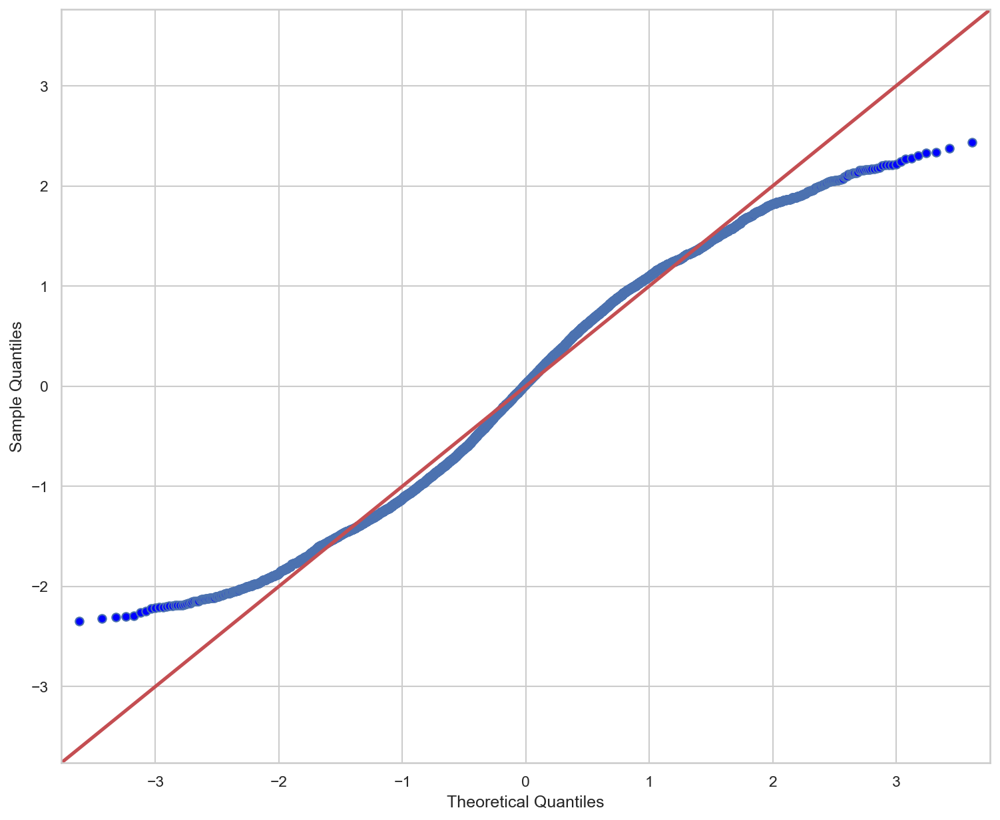

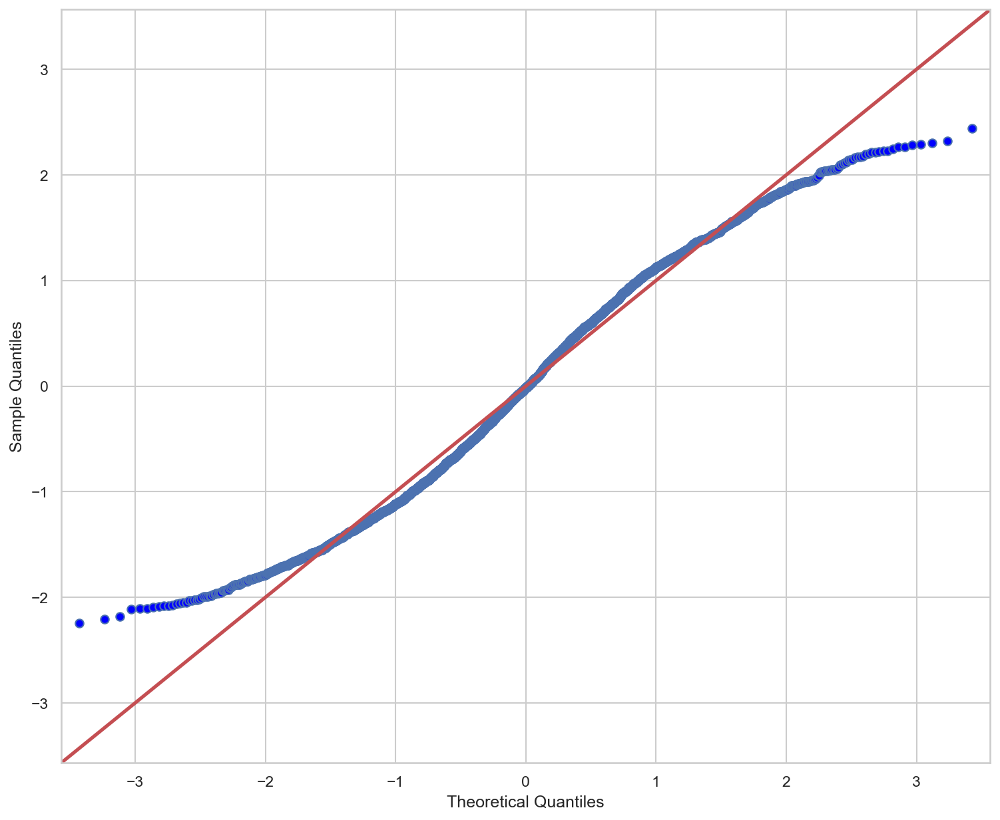

In [867]:
# def linear_reg(data, target_col):
#     y_cols = [target_col]
#     X = data
#     y = dummy_df[y_cols]
#     X = X.drop(columns=y_cols)

#     return linear_model.LinearRegression().fit(X, y), X, y

# reg, X, y = linear_reg(data=dummy_df, target_col="Additional_charges")
# reg.score(X,y), reg.coef_, reg.intercept_


In [667]:
# VIFS = {col: variance_inflation_factor(X.values, i).round(3) for i,col in enumerate(X.columns)}
# VIF_df = pd.DataFrame({'Feature': VIFS.keys(), 'VIF': VIFS.values()}).sort_values(by="VIF", ascending=False)

# VIF_df.style.hide_index()


In [ ]:
# VIF_CUTOFF_THRESHOLD = 10

# low_multicollinearity_df = VIF_df[VIF_df.VIF < VIF_CUTOFF_THRESHOLD]
# display(retained_features_df.sort_values(by="VIF"))

# retained_features = retained_features_df.feature


In [666]:
# sample_df = df.sample(1000, random_state=0)
# sns.lmplot(y="Additional_Charges", x="Age", data=sample_df, height=6,  ci=None)


In [ ]:
# display(retained_features_df.feature.to_list())

# """
#                                  OLS Regression Results
# =======================================================================================
# Dep. Variable:     Additional_charges   R-squared (uncentered):                   0.987
# Model:                            OLS   Adj. R-squared (uncentered):              0.987
# Method:                 Least Squares   F-statistic:                          5.950e+04
# Date:                Sun, 01 May 2022   Prob (F-statistic):                        0.00
# Time:                        17:02:26   Log-Likelihood:                         -332.22
# No. Observations:               10000   AIC:                                      690.4
# Df Residuals:                    9987   BIC:                                      784.2
# Df Model:                          13
# Covariance Type:            nonrobust
# ======================================================================================================
#                                          coef    std err          t      P>|t|      [0.025      0.975]
# ------------------------------------------------------------------------------------------------------
# Age                                    0.7043      0.002    289.008      0.000       0.700       0.709
# VitD_levels                           -0.0312      0.001    -21.389      0.000      -0.034      -0.028
# Doc_visits                            -0.0176      0.002     -7.811      0.000      -0.022      -0.013
# Area_Suburban                         -0.0064      0.003     -2.235      0.025      -0.012      -0.001
# Area_Urban                            -0.0084      0.003     -2.920      0.004      -0.014      -0.003
# Gender_Male                            0.0082      0.002      3.305      0.001       0.003       0.013
# Initial_admin_EmergencyAdmission       0.0308      0.003     10.156      0.000       0.025       0.037
# Initial_admin_ObservationAdmission    -0.0107      0.003     -3.518      0.000      -0.017      -0.005
# HighBlood_Yes                          0.6466      0.002    258.680      0.000       0.642       0.651
# Stroke_Yes                             0.0206      0.003      8.241      0.000       0.016       0.026
# Complication_risk_Low                 -0.0361      0.003    -12.767      0.000      -0.042      -0.031
# Complication_risk_Medium              -0.0336      0.003    -11.922      0.000      -0.039      -0.028
# Arthritis_Yes                         -0.0063      0.002     -2.520      0.012      -0.011      -0.001
# ==============================================================================
# Omnibus:                      889.193   Durbin-Watson:                   2.012
# Prob(Omnibus):                  0.000   Jarque-Bera (JB):              273.665
# Skew:                          -0.005   Prob(JB):                     3.75e-60
# Kurtosis:                       2.190   Cond. No.                         16.5
# ==============================================================================
# """

# def get_stats(data, x_columns, y_column):
#     x = data[x_columns]
#     # x = x / np.std(x)
#     y = data[y_column]
#     # y = y / np.std(y)
#     results = sm.OLS(y, x).fit()
#     print("residuals", results.resid.mean())
#     print(results.mse_resid)
#     print(results.summary())

# # x_columns = dummy_df.columns.to_list()
# x_columns = retained_features_df.feature.to_list()

# # for remove_col in ["Additional_charges", "Population", "Children", "Income", "VitD_levels", "Doc_visits", "Full_meals_eaten", "vitD_supp", "Area_Suburban", "Area_Urban", "Marital_Married", "Marital_NeverMarried", "Marital_Separated", "Marital_Widowed", "Gender_Nonbinary", "ReAdmis_Yes", "Soft_drink_Yes", "Initial_admin_ObservationAdmission", "Overweight_Yes", "Arthritis_Yes", "BackPain_Yes", "Allergic_rhinitis_Yes", "Asthma_Yes", "Services_CTScan", "Services_Intravenous", "Services_MRI"]:
# #     x_columns.remove(remove_col)

# print(x_columns)
# # R-squared (uncentered):                   0.987
# for remove_col in ["Population", "Children", "Income", "Full_meals_eaten", "vitD_supp", "Marital_Married", "Marital_NeverMarried", "Marital_Separated", "Marital_Widowed", "Gender_Nonbinary", "ReAdmis_Yes", "Soft_drink_Yes", "Overweight_Yes", "Diabetes_Yes", "Hyperlipidemia_Yes", "BackPain_Yes", "Anxiety_Yes", "Allergic_rhinitis_Yes", "Reflux_esophagitis_Yes", "Asthma_Yes", "Services_CTScan", "Services_Intravenous", "Services_MRI"]:
#     x_columns.remove(remove_col)

# # x_columns.remove("Gender_Nonbinary")
# # x_columns.remove("Initial_days")

# x_columns
# get_stats(dummy_df, x_columns, "Additional_charges")


##### Standardize Numeric Variables
Standardize independent variables. "In order for our machine learning or deep learning model to work well, it is very necessary for the data to have the same scale in terms of the Feature to avoid bias in the outcome."

In [665]:
# """
# The preprocessing.scale(data) function can be used to standardize the data values to a value having mean equivalent to zero and standard deviation as 1.


# """
# # standard_df = preprocessing.scale(X_data)

# # exclude columns you don't want
# x_cols = df.columns[~df.columns.isin(['Additional_Charges'])]
# X_data = df[x_cols]

# standard_df = pd.DataFrame(preprocessing.scale(X_data), columns=x_cols)
# standard_df["Additional_Charges"] = df["Additional_Charges"]
# standard_df = standard_df[sorted(standard_df.columns)]

# standard_df.head()


In [664]:
# _ = standard_df.hist(figsize=(20, 20))
